# Benchmarking Field Transformations


### DONE - FT-HMC implemented for 8x8 2D QED (using SiLU as activation function).

- [x] Try to minimize size of the force in training. No significant improvements.
- [x]  Some test on ergodicity
- [x] (calculate the probablity of generating the configs obtained via conventional HMC).

### TODO

- [ ] Plot the force size distribution 
- [ ] Is the large force from the original action or Field-Transforma
tion the determinant?
- [ ] If from the determinant, then the fermion force won't cause problem for HMC
- [ ] Use the same Field-Transformation for larger system (say 16x16, 32x32, 64x64, etc)
- [ ] Study how the delta H depends on the system size ( perhaps delta H ~ sqrt(volume) )
- [ ] Study the auto-correlation for observables, topo, plaq, flowed plaq, etc.
- [ ] Improving the Field-Transformation to reduce force.

## Setup, `import`'s, ..., etc

In [1]:
import os
import sys
import torch

from functools import reduce
from IPython.core.interactiveshell import InteractiveShell

%load_ext autoreload
%autoreload 2

%config InlineBackend.figure_format ='retina'

InteractiveShell.ast_node_interactivity = "all"


project_dir = os.path.abspath('../../')
if project_dir not in sys.path:
    sys.path.append(project_dir)

In [2]:
import fthmc.utils.io as io
logger = io.Logger()

torch.manual_seed(9)
# torch.set_default_tensor_type(torch.FloatTensor)

#torch.set_num_threads(param.nth)
#torch.set_num_interop_threads(param.nth_interop)
#os.environ["OMP_NUM_THREADS"] = str(param.nth)
#os.environ["KMP_BLOCKTIME"] = "0"
#os.environ["KMP_SETTINGS"] = "1"
#os.environ["KMP_AFFINITY"]= "granularity=fine,verbose,compact,1,0"

torch.set_default_tensor_type(torch.FloatTensor)
logger = io.Logger()

## Specify `Param` object

In [3]:
import matplotlib as mpl

from fthmc.train import train
from fthmc.utils.param import Param
from fthmc.config import TrainConfig, PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_u1_equiv_layers, set_weights
from fthmc.utils.plot_helpers import save_live_plots

import fthmc.utils.qed_helpers as qed

import datetime

from fthmc.train import run as hmc_run
from fthmc.config import LOGS_DIR

mpl.rcParams['text.usetex'] = False

param = {
    'L': 4,
    'tau': 1.,
    'nrun': 5,
    'beta': 4.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 100,
    'seed': 1331,
}

train_config = TrainConfig(**{
    'n_era': 50,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

param = Param(**param)
logger.log(repr(param))
logger.log(f'train_config: {train_config}')

DAYSTR = io.get_timestamp('%Y-%m-%d')
TSTAMP = io.get_timestamp('%Y-%m-%d-%H%M')
NOW = io.get_timestamp('%Y-%m-%d-%H%M%S')

PARAM_DIR = os.path.join(LOGS_DIR, param.uniquestr())
METRICS_DIR = os.path.join(PARAM_DIR, 'metrics')
MODEL_DIR = os.path.join(PARAM_DIR, 'models')
PLOTS_DIR = os.path.join(PARAM_DIR, 'plots')

io.check_else_make_dir(PARAM_DIR)
io.check_else_make_dir(MODEL_DIR)
io.check_else_make_dir(METRICS_DIR)
io.check_else_make_dir(PLOTS_DIR)


Bad key "mathtext.fallback" on line 160 in
/home/foremans1/.config/matplotlib/stylelib/classic.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.2.2/matplotlibrc.template
or from the matplotlib source distribution

Bad key "axes.titley" on line 181 in
/home/foremans1/.config/matplotlib/stylelib/classic.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.2.2/matplotlibrc.template
or from the matplotlib source distribution
Duplicate key in file PosixPath('/home/foremans1/.config/matplotlib/stylelib/dark_jupyter.mplstyle') line #92.
Duplicate key in file PosixPath('/home/foremans1/.config/matplotlib/stylelib/dark_jupyter.mplstyle') line #93.


TORCH DEVICE: cuda


[17:30:30]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=4                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[4, 4]                                                                       
            nd=2                                                                             
            shape=[2, 4, 4]                                                                  
            volume=16                                                                        
            dt=0.1

            train_config: TrainConfig(n_era=50, n_epoch=100, n_layers=24, n_s_nets=2,        
            hidden_sizes=[8, 8], kernel_size=3, base_lr=0.001, batch_size=256,               
            print_freq=100, plot_freq=100, with_force=False)

## Specify directories for saving model, etc

In [4]:
fields, metrics = hmc_run(param, logger=logger, keep_fields=True)

hmc_metrics_dir = os.path.join(METRICS_DIR, 'hmc', TSTAMP)
outfile = os.path.join(hmc_metrics_dir, f'hmc_metrics.z')

io.save_history(metrics, outfile, name='hmc_metrics')

[17:30:32]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=4                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[4, 4]                                                                       
            nd=2                                                                             
            shape=[2, 4, 4]                                                                  
            volume=16                                                                        
            dt=0.1

            action=1.000 plaq=0.000 charge=0.000

            dt=0.008 traj=2 accept=True dH=-0.146 expdH=1.157 dq=0.000

            dt=0.007 traj=4 accept=True dH=-0.068 expdH=1.070 dq=0.000

            dt=0.007 traj=6 accept=True dH=-0.155 expdH=1.168 dq=0.000

            dt=0.007 traj=8 accept=True dH=-0.085 expdH=1.089 dq=0.000

            dt=0.007 traj=10 accept=True dH=-0.293 expdH=1.341 dq=0.000

            dt=0.007 traj=12 accept=True dH=0.030 expdH=0.970 dq=0.000

            dt=0.007 traj=14 accept=True dH=-0.159 expdH=1.173 dq=0.000

            dt=0.007 traj=16 accept=True dH=-0.073 expdH=1.076 dq=0.000

            dt=0.007 traj=18 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.007 traj=20 accept=True dH=-0.005 expdH=1.005 dq=0.000

            dt=0.007 traj=22 accept=True dH=-0.004 expdH=1.004 dq=0.000

            dt=0.008 traj=24 accept=True dH=-0.220 expdH=1.246 dq=0.000

            dt=0.007 traj=26 accept=True dH=-0.083 expdH=1.086 dq=0.000

            dt=0.008 traj=28 accept=True dH=-0.044 expdH=1.045 dq=0.000

            dt=0.007 traj=30 accept=True dH=-0.098 expdH=1.103 dq=0.000

            dt=0.007 traj=32 accept=True dH=-0.363 expdH=1.437 dq=0.000

            dt=0.007 traj=34 accept=True dH=0.032 expdH=0.968 dq=0.000

            dt=0.008 traj=36 accept=True dH=-0.053 expdH=1.054 dq=0.000

            dt=0.007 traj=38 accept=True dH=-0.026 expdH=1.027 dq=0.000

            dt=0.007 traj=40 accept=True dH=-0.148 expdH=1.160 dq=0.000

            dt=0.007 traj=42 accept=True dH=0.051 expdH=0.950 dq=0.000

            dt=0.007 traj=44 accept=True dH=-0.162 expdH=1.175 dq=0.000

            dt=0.007 traj=46 accept=True dH=-0.100 expdH=1.105 dq=0.000

            dt=0.007 traj=48 accept=True dH=-0.092 expdH=1.096 dq=0.000

            dt=0.007 traj=50 accept=True dH=-0.104 expdH=1.110 dq=0.000

            dt=0.007 traj=52 accept=True dH=-0.071 expdH=1.073 dq=0.000

            dt=0.007 traj=54 accept=True dH=-0.135 expdH=1.145 dq=0.000

            dt=0.008 traj=56 accept=False dH=0.045 expdH=0.956 dq=0.000

[17:30:33]  dt=0.007 traj=58 accept=False dH=0.085 expdH=0.919 dq=0.000

            dt=0.007 traj=60 accept=True dH=0.091 expdH=0.913 dq=0.000

            dt=0.007 traj=62 accept=True dH=0.017 expdH=0.983 dq=0.000

            dt=0.007 traj=64 accept=True dH=0.162 expdH=0.850 dq=0.000

            dt=0.007 traj=66 accept=True dH=-0.105 expdH=1.111 dq=0.000

            dt=0.007 traj=68 accept=True dH=-0.098 expdH=1.103 dq=0.000

            dt=0.008 traj=70 accept=True dH=0.128 expdH=0.880 dq=0.000

            dt=0.007 traj=72 accept=True dH=-0.072 expdH=1.075 dq=0.000

            dt=0.007 traj=74 accept=True dH=-0.066 expdH=1.068 dq=0.000

            dt=0.007 traj=76 accept=True dH=-0.034 expdH=1.034 dq=0.000

            dt=0.007 traj=78 accept=True dH=-0.021 expdH=1.021 dq=0.000

            dt=0.007 traj=80 accept=True dH=0.193 expdH=0.825 dq=0.000

            dt=0.007 traj=82 accept=True dH=0.039 expdH=0.962 dq=0.000

            dt=0.007 traj=84 accept=True dH=0.120 expdH=0.887 dq=0.000

            dt=0.007 traj=86 accept=True dH=-0.051 expdH=1.053 dq=0.000

            dt=0.008 traj=88 accept=True dH=0.029 expdH=0.972 dq=0.000

            dt=0.007 traj=90 accept=True dH=-0.082 expdH=1.085 dq=0.000

            dt=0.007 traj=92 accept=True dH=0.038 expdH=0.963 dq=0.000

            dt=0.007 traj=94 accept=True dH=-0.097 expdH=1.102 dq=0.000

            dt=0.007 traj=96 accept=True dH=-0.136 expdH=1.145 dq=0.000

            dt=0.008 traj=98 accept=True dH=-0.057 expdH=1.059 dq=0.000

            dt=0.007 traj=100 accept=True dH=0.197 expdH=0.821 dq=0.000

            dt=0.008 traj=102 accept=True dH=-0.198 expdH=1.219 dq=0.000

            dt=0.007 traj=104 accept=True dH=-0.126 expdH=1.134 dq=0.000

            dt=0.007 traj=106 accept=True dH=0.054 expdH=0.947 dq=0.000

            dt=0.007 traj=108 accept=True dH=0.228 expdH=0.797 dq=0.000

            dt=0.008 traj=110 accept=True dH=0.119 expdH=0.888 dq=0.000

            dt=0.008 traj=112 accept=True dH=-0.140 expdH=1.150 dq=0.000

            dt=0.007 traj=114 accept=True dH=-0.279 expdH=1.321 dq=0.000

            dt=0.008 traj=116 accept=True dH=0.095 expdH=0.909 dq=0.000

            dt=0.007 traj=118 accept=True dH=0.059 expdH=0.943 dq=0.000

            dt=0.007 traj=120 accept=True dH=-0.040 expdH=1.040 dq=0.000

            dt=0.008 traj=122 accept=True dH=-0.091 expdH=1.095 dq=0.000

            dt=0.007 traj=124 accept=True dH=0.090 expdH=0.913 dq=0.000

            dt=0.007 traj=126 accept=True dH=-0.080 expdH=1.084 dq=0.000

            dt=0.008 traj=128 accept=True dH=-0.041 expdH=1.042 dq=0.000

            dt=0.008 traj=130 accept=True dH=0.013 expdH=0.987 dq=0.000

            dt=0.007 traj=132 accept=True dH=0.027 expdH=0.973 dq=0.000

            dt=0.007 traj=134 accept=True dH=-0.064 expdH=1.066 dq=0.000

            dt=0.007 traj=136 accept=True dH=0.020 expdH=0.980 dq=0.000

            dt=0.007 traj=138 accept=True dH=0.038 expdH=0.963 dq=0.000

            dt=0.007 traj=140 accept=True dH=0.063 expdH=0.939 dq=0.000

            dt=0.007 traj=142 accept=True dH=-0.005 expdH=1.005 dq=0.000

            dt=0.007 traj=144 accept=True dH=-0.124 expdH=1.132 dq=0.000

            dt=0.007 traj=146 accept=True dH=-0.046 expdH=1.047 dq=0.000

            dt=0.007 traj=148 accept=True dH=0.329 expdH=0.720 dq=0.000

[17:30:34]  dt=0.007 traj=150 accept=True dH=0.050 expdH=0.951 dq=0.000

            dt=0.008 traj=152 accept=True dH=-0.123 expdH=1.131 dq=0.000

            dt=0.007 traj=154 accept=True dH=-0.078 expdH=1.081 dq=0.000

            dt=0.007 traj=156 accept=True dH=-0.137 expdH=1.147 dq=0.000

            dt=0.007 traj=158 accept=True dH=0.153 expdH=0.858 dq=0.000

            dt=0.008 traj=160 accept=True dH=0.110 expdH=0.896 dq=0.000

            dt=0.008 traj=162 accept=True dH=0.032 expdH=0.969 dq=0.000

            dt=0.007 traj=164 accept=True dH=-0.186 expdH=1.205 dq=0.000

            dt=0.007 traj=166 accept=True dH=-0.023 expdH=1.024 dq=0.000

            dt=0.008 traj=168 accept=True dH=-0.132 expdH=1.141 dq=0.000

            dt=0.007 traj=170 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.007 traj=172 accept=True dH=0.203 expdH=0.816 dq=0.000

            dt=0.007 traj=174 accept=True dH=-0.221 expdH=1.248 dq=0.000

            dt=0.007 traj=176 accept=True dH=0.173 expdH=0.841 dq=0.000

            dt=0.007 traj=178 accept=True dH=-0.083 expdH=1.087 dq=0.000

            dt=0.007 traj=180 accept=True dH=0.112 expdH=0.894 dq=0.000

            dt=0.007 traj=182 accept=True dH=0.167 expdH=0.846 dq=0.000

            dt=0.008 traj=184 accept=True dH=0.126 expdH=0.881 dq=0.000

            dt=0.007 traj=186 accept=True dH=-0.092 expdH=1.096 dq=0.000

            dt=0.007 traj=188 accept=True dH=-0.006 expdH=1.006 dq=0.000

            dt=0.007 traj=190 accept=True dH=-0.032 expdH=1.032 dq=0.000

            dt=0.007 traj=192 accept=True dH=-0.128 expdH=1.136 dq=0.000

            dt=0.007 traj=194 accept=True dH=0.076 expdH=0.927 dq=0.000

            dt=0.008 traj=196 accept=True dH=0.179 expdH=0.836 dq=0.000

            dt=0.007 traj=198 accept=True dH=-0.025 expdH=1.026 dq=0.000

            dt=0.007 traj=200 accept=True dH=-0.002 expdH=1.002 dq=0.000

            dt=0.007 traj=202 accept=True dH=-0.102 expdH=1.107 dq=0.000

            dt=0.008 traj=204 accept=True dH=0.157 expdH=0.854 dq=0.000

            dt=0.008 traj=206 accept=True dH=0.078 expdH=0.925 dq=0.000

            dt=0.007 traj=208 accept=True dH=-0.026 expdH=1.027 dq=0.000

            dt=0.007 traj=210 accept=True dH=-0.201 expdH=1.223 dq=0.000

            dt=0.007 traj=212 accept=False dH=0.095 expdH=0.909 dq=0.000

            dt=0.007 traj=214 accept=True dH=0.089 expdH=0.915 dq=0.000

            dt=0.007 traj=216 accept=True dH=-0.023 expdH=1.023 dq=0.000

            dt=0.008 traj=218 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.007 traj=220 accept=True dH=-0.112 expdH=1.118 dq=0.000

            dt=0.007 traj=222 accept=True dH=0.095 expdH=0.909 dq=0.000

            dt=0.008 traj=224 accept=True dH=-0.007 expdH=1.007 dq=0.000

            dt=0.007 traj=226 accept=True dH=0.017 expdH=0.983 dq=0.000

            dt=0.007 traj=228 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.008 traj=230 accept=True dH=-0.070 expdH=1.073 dq=0.000

            dt=0.007 traj=232 accept=True dH=-0.109 expdH=1.115 dq=0.000

            dt=0.007 traj=234 accept=True dH=-0.203 expdH=1.225 dq=0.000

            dt=0.007 traj=236 accept=False dH=0.118 expdH=0.889 dq=0.000

            dt=0.007 traj=238 accept=True dH=-0.119 expdH=1.126 dq=0.000

[17:30:35]  dt=0.007 traj=240 accept=False dH=0.016 expdH=0.984 dq=0.000

            dt=0.007 traj=242 accept=True dH=0.037 expdH=0.963 dq=0.000

            dt=0.008 traj=244 accept=False dH=0.075 expdH=0.928 dq=0.000

            dt=0.007 traj=246 accept=True dH=0.034 expdH=0.966 dq=0.000

            dt=0.007 traj=248 accept=True dH=0.052 expdH=0.949 dq=0.000

            dt=0.007 traj=250 accept=True dH=-0.124 expdH=1.132 dq=0.000

            dt=0.008 traj=252 accept=True dH=0.126 expdH=0.882 dq=0.000

            dt=0.008 traj=254 accept=True dH=-0.081 expdH=1.084 dq=0.000

            dt=0.007 traj=256 accept=True dH=-0.216 expdH=1.241 dq=0.000

            dt=0.007 traj=258 accept=True dH=0.341 expdH=0.711 dq=0.000

            dt=0.007 traj=260 accept=True dH=-0.062 expdH=1.064 dq=0.000

            dt=0.007 traj=262 accept=False dH=0.217 expdH=0.805 dq=0.000

            dt=0.008 traj=264 accept=True dH=-0.127 expdH=1.135 dq=0.000

            dt=0.007 traj=266 accept=True dH=-0.018 expdH=1.018 dq=0.000

            dt=0.007 traj=268 accept=True dH=0.069 expdH=0.933 dq=0.000

            dt=0.007 traj=270 accept=True dH=-0.118 expdH=1.125 dq=0.000

            dt=0.007 traj=272 accept=True dH=-0.048 expdH=1.049 dq=0.000

            dt=0.007 traj=274 accept=True dH=0.035 expdH=0.965 dq=0.000

            dt=0.008 traj=276 accept=True dH=0.129 expdH=0.879 dq=0.000

            dt=0.007 traj=278 accept=True dH=0.156 expdH=0.856 dq=0.000

            dt=0.007 traj=280 accept=True dH=-0.033 expdH=1.033 dq=0.000

            dt=0.007 traj=282 accept=True dH=-0.040 expdH=1.041 dq=0.000

            dt=0.008 traj=284 accept=True dH=0.086 expdH=0.918 dq=0.000

            dt=0.007 traj=286 accept=True dH=-0.036 expdH=1.037 dq=0.000

            dt=0.008 traj=288 accept=False dH=0.110 expdH=0.896 dq=0.000

            dt=0.007 traj=290 accept=True dH=0.109 expdH=0.897 dq=0.000

            dt=0.007 traj=292 accept=True dH=0.028 expdH=0.972 dq=0.000

            dt=0.007 traj=294 accept=True dH=0.105 expdH=0.901 dq=0.000

            dt=0.008 traj=296 accept=True dH=0.130 expdH=0.878 dq=0.000

            dt=0.008 traj=298 accept=True dH=-0.208 expdH=1.232 dq=0.000

            dt=0.008 traj=300 accept=True dH=0.042 expdH=0.959 dq=0.000

            dt=0.008 traj=302 accept=True dH=-0.090 expdH=1.095 dq=0.000

            dt=0.007 traj=304 accept=True dH=-0.172 expdH=1.187 dq=0.000

            dt=0.007 traj=306 accept=True dH=0.088 expdH=0.916 dq=0.000

            dt=0.007 traj=308 accept=True dH=0.173 expdH=0.841 dq=0.000

            dt=0.008 traj=310 accept=True dH=-0.047 expdH=1.049 dq=0.000

            dt=0.007 traj=312 accept=True dH=0.197 expdH=0.821 dq=0.000

            dt=0.007 traj=314 accept=True dH=-0.121 expdH=1.128 dq=0.000

            dt=0.007 traj=316 accept=True dH=0.117 expdH=0.889 dq=0.000

            dt=0.008 traj=318 accept=True dH=-0.115 expdH=1.121 dq=0.000

            dt=0.007 traj=320 accept=True dH=-0.153 expdH=1.165 dq=0.000

            dt=0.008 traj=322 accept=True dH=0.229 expdH=0.795 dq=0.000

            dt=0.007 traj=324 accept=True dH=0.056 expdH=0.945 dq=0.000

            dt=0.007 traj=326 accept=True dH=0.114 expdH=0.893 dq=0.000

            dt=0.007 traj=328 accept=True dH=-0.110 expdH=1.117 dq=0.000

            dt=0.007 traj=330 accept=True dH=-0.053 expdH=1.054 dq=0.000

[17:30:36]  dt=0.007 traj=332 accept=True dH=-0.087 expdH=1.091 dq=0.000

            dt=0.007 traj=334 accept=True dH=-0.005 expdH=1.005 dq=0.000

            dt=0.008 traj=336 accept=True dH=0.106 expdH=0.900 dq=0.000

            dt=0.007 traj=338 accept=True dH=-0.096 expdH=1.101 dq=0.000

            dt=0.007 traj=340 accept=True dH=0.048 expdH=0.953 dq=0.000

            dt=0.007 traj=342 accept=True dH=0.094 expdH=0.910 dq=0.000

            dt=0.008 traj=344 accept=True dH=0.168 expdH=0.846 dq=0.000

            dt=0.008 traj=346 accept=True dH=-0.106 expdH=1.111 dq=0.000

            dt=0.007 traj=348 accept=True dH=-0.159 expdH=1.172 dq=0.000

            dt=0.007 traj=350 accept=True dH=-0.006 expdH=1.006 dq=0.000

            dt=0.007 traj=352 accept=True dH=0.066 expdH=0.936 dq=0.000

            dt=0.007 traj=354 accept=True dH=-0.094 expdH=1.098 dq=0.000

            dt=0.008 traj=356 accept=True dH=-0.248 expdH=1.282 dq=0.000

            dt=0.008 traj=358 accept=True dH=-0.013 expdH=1.014 dq=0.000

            dt=0.007 traj=360 accept=True dH=0.211 expdH=0.810 dq=0.000

            dt=0.007 traj=362 accept=True dH=-0.076 expdH=1.079 dq=0.000

            dt=0.008 traj=364 accept=True dH=-0.095 expdH=1.100 dq=0.000

            dt=0.007 traj=366 accept=True dH=0.012 expdH=0.988 dq=0.000

            dt=0.008 traj=368 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.007 traj=370 accept=True dH=-0.055 expdH=1.057 dq=0.000

            dt=0.007 traj=372 accept=False dH=0.218 expdH=0.804 dq=0.000

            dt=0.007 traj=374 accept=True dH=-0.070 expdH=1.073 dq=0.000

            dt=0.008 traj=376 accept=True dH=-0.153 expdH=1.165 dq=0.000

            dt=0.007 traj=378 accept=True dH=0.046 expdH=0.955 dq=0.000

            dt=0.007 traj=380 accept=True dH=0.169 expdH=0.845 dq=0.000

            dt=0.008 traj=382 accept=True dH=0.010 expdH=0.990 dq=0.000

            dt=0.008 traj=384 accept=True dH=0.120 expdH=0.887 dq=0.000

            dt=0.007 traj=386 accept=True dH=0.027 expdH=0.973 dq=0.000

            dt=0.007 traj=388 accept=True dH=-0.008 expdH=1.008 dq=0.000

            dt=0.008 traj=390 accept=True dH=0.075 expdH=0.927 dq=0.000

            dt=0.008 traj=392 accept=True dH=0.066 expdH=0.936 dq=0.000

            dt=0.008 traj=394 accept=True dH=-0.119 expdH=1.126 dq=0.000

            dt=0.008 traj=396 accept=True dH=0.122 expdH=0.885 dq=0.000

            dt=0.007 traj=398 accept=True dH=-0.239 expdH=1.269 dq=0.000

            dt=0.008 traj=400 accept=True dH=0.102 expdH=0.903 dq=0.000

            dt=0.008 traj=402 accept=True dH=0.234 expdH=0.791 dq=0.000

            dt=0.007 traj=404 accept=True dH=-0.046 expdH=1.047 dq=0.000

            dt=0.008 traj=406 accept=True dH=-0.007 expdH=1.007 dq=0.000

            dt=0.008 traj=408 accept=True dH=-0.094 expdH=1.099 dq=0.000

            dt=0.007 traj=410 accept=True dH=0.142 expdH=0.867 dq=0.000

            dt=0.007 traj=412 accept=True dH=-0.032 expdH=1.032 dq=0.000

            dt=0.007 traj=414 accept=True dH=-0.066 expdH=1.069 dq=0.000

            dt=0.007 traj=416 accept=True dH=0.034 expdH=0.967 dq=0.000

            dt=0.007 traj=418 accept=True dH=-0.104 expdH=1.109 dq=0.000

            dt=0.008 traj=420 accept=True dH=-0.138 expdH=1.148 dq=0.000

            dt=0.007 traj=422 accept=True dH=-0.084 expdH=1.088 dq=0.000

[17:30:37]  dt=0.007 traj=424 accept=True dH=-0.103 expdH=1.108 dq=0.000

            dt=0.008 traj=426 accept=True dH=0.067 expdH=0.935 dq=0.000

            dt=0.007 traj=428 accept=True dH=0.015 expdH=0.985 dq=0.000

            dt=0.008 traj=430 accept=True dH=-0.011 expdH=1.011 dq=0.000

            dt=0.007 traj=432 accept=True dH=-0.062 expdH=1.064 dq=0.000

            dt=0.007 traj=434 accept=False dH=0.167 expdH=0.846 dq=0.000

            dt=0.008 traj=436 accept=True dH=0.245 expdH=0.783 dq=0.000

            dt=0.008 traj=438 accept=True dH=-0.149 expdH=1.161 dq=0.000

            dt=0.008 traj=440 accept=True dH=0.068 expdH=0.934 dq=0.000

            dt=0.008 traj=442 accept=True dH=-0.033 expdH=1.034 dq=0.000

            dt=0.007 traj=444 accept=True dH=-0.069 expdH=1.072 dq=0.000

            dt=0.007 traj=446 accept=True dH=-0.067 expdH=1.069 dq=0.000

            dt=0.008 traj=448 accept=True dH=-0.069 expdH=1.072 dq=0.000

            dt=0.007 traj=450 accept=True dH=-0.089 expdH=1.093 dq=0.000

            dt=0.007 traj=452 accept=True dH=-0.071 expdH=1.073 dq=0.000

            dt=0.007 traj=454 accept=True dH=-0.072 expdH=1.074 dq=0.000

            dt=0.007 traj=456 accept=True dH=-0.130 expdH=1.139 dq=0.000

            dt=0.007 traj=458 accept=True dH=0.004 expdH=0.996 dq=0.000

            dt=0.007 traj=460 accept=True dH=-0.171 expdH=1.187 dq=0.000

            dt=0.008 traj=462 accept=True dH=0.135 expdH=0.874 dq=0.000

            dt=0.007 traj=464 accept=True dH=0.033 expdH=0.968 dq=0.000

            dt=0.007 traj=466 accept=True dH=-0.102 expdH=1.107 dq=0.000

            dt=0.007 traj=468 accept=True dH=0.202 expdH=0.817 dq=0.000

            dt=0.008 traj=470 accept=True dH=0.027 expdH=0.974 dq=0.000

            dt=0.007 traj=472 accept=True dH=-0.014 expdH=1.014 dq=0.000

            dt=0.008 traj=474 accept=True dH=-0.025 expdH=1.025 dq=0.000

            dt=0.007 traj=476 accept=True dH=-0.063 expdH=1.064 dq=0.000

            dt=0.007 traj=478 accept=True dH=-0.060 expdH=1.061 dq=0.000

            dt=0.007 traj=480 accept=True dH=0.064 expdH=0.938 dq=1.000

            dt=0.008 traj=482 accept=True dH=-0.067 expdH=1.070 dq=0.000

            dt=0.008 traj=484 accept=True dH=0.240 expdH=0.787 dq=0.000

            dt=0.007 traj=486 accept=True dH=0.053 expdH=0.948 dq=0.000

            dt=0.007 traj=488 accept=True dH=0.068 expdH=0.934 dq=0.000

            dt=0.007 traj=490 accept=True dH=0.042 expdH=0.959 dq=0.000

            dt=0.007 traj=492 accept=True dH=0.082 expdH=0.922 dq=0.000

            dt=0.007 traj=494 accept=True dH=0.198 expdH=0.821 dq=0.000

            dt=0.007 traj=496 accept=True dH=-0.068 expdH=1.071 dq=0.000

            dt=0.008 traj=498 accept=True dH=-0.122 expdH=1.130 dq=0.000

            dt=0.008 traj=500 accept=True dH=-0.209 expdH=1.233 dq=0.000

            dt=0.008 traj=502 accept=True dH=-0.050 expdH=1.051 dq=0.000

            dt=0.008 traj=504 accept=True dH=-0.123 expdH=1.131 dq=0.000

            dt=0.007 traj=506 accept=True dH=-0.071 expdH=1.073 dq=0.000

            dt=0.008 traj=508 accept=True dH=0.097 expdH=0.908 dq=0.000

            dt=0.007 traj=510 accept=True dH=0.114 expdH=0.892 dq=0.000

            dt=0.007 traj=512 accept=True dH=-0.015 expdH=1.015 dq=0.000

[17:30:38]  dt=0.007 traj=514 accept=True dH=0.167 expdH=0.846 dq=0.000

            dt=0.008 traj=516 accept=True dH=-0.094 expdH=1.099 dq=0.000

            dt=0.007 traj=518 accept=True dH=-0.040 expdH=1.041 dq=0.000

            dt=0.008 traj=520 accept=True dH=0.092 expdH=0.912 dq=0.000

            dt=0.007 traj=522 accept=True dH=-0.010 expdH=1.010 dq=0.000

            dt=0.007 traj=524 accept=True dH=0.136 expdH=0.873 dq=0.000

            dt=0.008 traj=526 accept=True dH=0.060 expdH=0.942 dq=0.000

            dt=0.007 traj=528 accept=False dH=0.016 expdH=0.985 dq=0.000

            dt=0.007 traj=530 accept=True dH=-0.044 expdH=1.045 dq=0.000

            dt=0.007 traj=532 accept=True dH=-0.002 expdH=1.002 dq=0.000

            dt=0.007 traj=534 accept=True dH=-0.036 expdH=1.036 dq=0.000

            dt=0.007 traj=536 accept=True dH=0.040 expdH=0.960 dq=0.000

            dt=0.007 traj=538 accept=True dH=0.011 expdH=0.989 dq=0.000

            dt=0.007 traj=540 accept=True dH=-0.225 expdH=1.252 dq=0.000

            dt=0.008 traj=542 accept=True dH=-0.026 expdH=1.026 dq=0.000

            dt=0.007 traj=544 accept=True dH=0.104 expdH=0.902 dq=0.000

            dt=0.008 traj=546 accept=True dH=-0.016 expdH=1.016 dq=0.000

            dt=0.007 traj=548 accept=True dH=-0.088 expdH=1.091 dq=0.000

            dt=0.007 traj=550 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.007 traj=552 accept=True dH=-0.044 expdH=1.045 dq=0.000

            dt=0.007 traj=554 accept=True dH=-0.134 expdH=1.144 dq=0.000

            dt=0.007 traj=556 accept=True dH=-0.038 expdH=1.039 dq=0.000

            dt=0.007 traj=558 accept=True dH=-0.129 expdH=1.138 dq=0.000

            dt=0.007 traj=560 accept=True dH=-0.148 expdH=1.159 dq=0.000

            dt=0.007 traj=562 accept=True dH=-0.109 expdH=1.115 dq=0.000

            dt=0.007 traj=564 accept=True dH=0.104 expdH=0.901 dq=0.000

            dt=0.007 traj=566 accept=True dH=-0.138 expdH=1.149 dq=0.000

            dt=0.007 traj=568 accept=True dH=-0.132 expdH=1.141 dq=0.000

            dt=0.007 traj=570 accept=True dH=0.166 expdH=0.847 dq=0.000

            dt=0.008 traj=572 accept=True dH=0.033 expdH=0.967 dq=0.000

            dt=0.008 traj=574 accept=True dH=-0.012 expdH=1.012 dq=0.000

            dt=0.007 traj=576 accept=True dH=-0.048 expdH=1.049 dq=0.000

            dt=0.007 traj=578 accept=True dH=0.005 expdH=0.995 dq=0.000

            dt=0.007 traj=580 accept=True dH=0.128 expdH=0.879 dq=0.000

            dt=0.007 traj=582 accept=True dH=-0.120 expdH=1.128 dq=0.000

            dt=0.007 traj=584 accept=True dH=-0.086 expdH=1.090 dq=0.000

            dt=0.007 traj=586 accept=True dH=0.133 expdH=0.876 dq=0.000

            dt=0.007 traj=588 accept=True dH=0.117 expdH=0.890 dq=0.000

            dt=0.008 traj=590 accept=True dH=-0.063 expdH=1.065 dq=0.000

            dt=0.008 traj=592 accept=True dH=-0.091 expdH=1.095 dq=0.000

            dt=0.008 traj=594 accept=True dH=-0.281 expdH=1.325 dq=0.000

            dt=0.007 traj=596 accept=True dH=-0.152 expdH=1.164 dq=0.000

            dt=0.007 traj=598 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.008 traj=600 accept=True dH=-0.056 expdH=1.057 dq=0.000

            dt=0.007 traj=602 accept=True dH=0.023 expdH=0.977 dq=0.000

            dt=0.007 traj=604 accept=True dH=-0.144 expdH=1.155 dq=0.000

[17:30:39]  dt=0.007 traj=606 accept=True dH=0.077 expdH=0.926 dq=0.000

            dt=0.007 traj=608 accept=True dH=-0.031 expdH=1.032 dq=0.000

            dt=0.008 traj=610 accept=True dH=0.093 expdH=0.911 dq=0.000

            dt=0.007 traj=612 accept=True dH=-0.196 expdH=1.216 dq=0.000

            dt=0.007 traj=614 accept=True dH=0.172 expdH=0.842 dq=0.000

            dt=0.007 traj=616 accept=True dH=0.150 expdH=0.861 dq=0.000

            dt=0.008 traj=618 accept=False dH=0.187 expdH=0.830 dq=0.000

            dt=0.007 traj=620 accept=True dH=-0.129 expdH=1.138 dq=0.000

            dt=0.007 traj=622 accept=True dH=0.127 expdH=0.881 dq=0.000

            dt=0.007 traj=624 accept=True dH=0.064 expdH=0.938 dq=0.000

            dt=0.007 traj=626 accept=True dH=-0.032 expdH=1.033 dq=0.000

            dt=0.007 traj=628 accept=True dH=0.122 expdH=0.885 dq=0.000

            dt=0.007 traj=630 accept=True dH=0.256 expdH=0.774 dq=0.000

            dt=0.007 traj=632 accept=True dH=0.021 expdH=0.979 dq=0.000

            dt=0.007 traj=634 accept=True dH=0.195 expdH=0.823 dq=0.000

            dt=0.008 traj=636 accept=True dH=-0.007 expdH=1.007 dq=0.000

            dt=0.007 traj=638 accept=True dH=0.014 expdH=0.986 dq=0.000

            dt=0.007 traj=640 accept=True dH=-0.094 expdH=1.099 dq=0.000

            dt=0.008 traj=642 accept=True dH=0.090 expdH=0.914 dq=0.000

            dt=0.008 traj=644 accept=True dH=-0.119 expdH=1.126 dq=0.000

            dt=0.007 traj=646 accept=True dH=0.027 expdH=0.974 dq=0.000

            dt=0.008 traj=648 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.007 traj=650 accept=True dH=0.029 expdH=0.972 dq=0.000

            dt=0.007 traj=652 accept=True dH=0.063 expdH=0.939 dq=0.000

            dt=0.008 traj=654 accept=True dH=-0.069 expdH=1.072 dq=0.000

            dt=0.008 traj=656 accept=True dH=-0.005 expdH=1.005 dq=0.000

            dt=0.007 traj=658 accept=True dH=0.081 expdH=0.922 dq=0.000

            dt=0.007 traj=660 accept=True dH=-0.062 expdH=1.064 dq=0.000

            dt=0.007 traj=662 accept=True dH=-0.071 expdH=1.073 dq=0.000

            dt=0.008 traj=664 accept=True dH=0.184 expdH=0.832 dq=0.000

            dt=0.007 traj=666 accept=True dH=0.015 expdH=0.985 dq=0.000

            dt=0.007 traj=668 accept=True dH=-0.081 expdH=1.084 dq=0.000

            dt=0.007 traj=670 accept=True dH=-0.074 expdH=1.077 dq=0.000

            dt=0.007 traj=672 accept=True dH=0.205 expdH=0.814 dq=0.000

            dt=0.007 traj=674 accept=True dH=0.323 expdH=0.724 dq=0.000

            dt=0.008 traj=676 accept=True dH=-0.298 expdH=1.348 dq=0.000

            dt=0.007 traj=678 accept=True dH=-0.025 expdH=1.025 dq=0.000

            dt=0.008 traj=680 accept=True dH=-0.007 expdH=1.007 dq=0.000

            dt=0.007 traj=682 accept=True dH=0.138 expdH=0.871 dq=0.000

            dt=0.007 traj=684 accept=True dH=0.053 expdH=0.948 dq=0.000

            dt=0.008 traj=686 accept=True dH=-0.190 expdH=1.209 dq=0.000

            dt=0.007 traj=688 accept=True dH=0.144 expdH=0.866 dq=0.000

            dt=0.008 traj=690 accept=True dH=0.072 expdH=0.930 dq=0.000

            dt=0.007 traj=692 accept=True dH=-0.055 expdH=1.057 dq=0.000

            dt=0.008 traj=694 accept=True dH=0.201 expdH=0.818 dq=0.000

            dt=0.008 traj=696 accept=False dH=0.055 expdH=0.946 dq=0.000

[17:30:40]  dt=0.008 traj=698 accept=True dH=0.216 expdH=0.806 dq=0.000

            dt=0.007 traj=700 accept=True dH=0.040 expdH=0.961 dq=0.000

            dt=0.008 traj=702 accept=True dH=0.157 expdH=0.855 dq=0.000

            dt=0.007 traj=704 accept=True dH=-0.000 expdH=1.000 dq=0.000

            dt=0.007 traj=706 accept=True dH=-0.108 expdH=1.114 dq=0.000

            dt=0.008 traj=708 accept=True dH=-0.108 expdH=1.114 dq=0.000

            dt=0.008 traj=710 accept=True dH=0.141 expdH=0.868 dq=0.000

            dt=0.007 traj=712 accept=True dH=0.080 expdH=0.924 dq=0.000

            dt=0.008 traj=714 accept=False dH=0.259 expdH=0.772 dq=0.000

            dt=0.008 traj=716 accept=True dH=0.194 expdH=0.824 dq=0.000

            dt=0.007 traj=718 accept=True dH=0.061 expdH=0.941 dq=0.000

            dt=0.008 traj=720 accept=True dH=0.121 expdH=0.886 dq=0.000

            dt=0.007 traj=722 accept=True dH=0.057 expdH=0.944 dq=0.000

            dt=0.008 traj=724 accept=True dH=-0.102 expdH=1.107 dq=0.000

            dt=0.008 traj=726 accept=False dH=0.188 expdH=0.828 dq=0.000

            dt=0.008 traj=728 accept=True dH=-0.009 expdH=1.009 dq=0.000

            dt=0.007 traj=730 accept=True dH=0.017 expdH=0.983 dq=0.000

            dt=0.007 traj=732 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.008 traj=734 accept=True dH=0.081 expdH=0.922 dq=0.000

            dt=0.008 traj=736 accept=True dH=0.036 expdH=0.964 dq=0.000

            dt=0.007 traj=738 accept=True dH=0.233 expdH=0.792 dq=0.000

            dt=0.007 traj=740 accept=True dH=-0.290 expdH=1.337 dq=0.000

            dt=0.008 traj=742 accept=True dH=0.043 expdH=0.958 dq=0.000

            dt=0.008 traj=744 accept=True dH=0.033 expdH=0.968 dq=0.000

            dt=0.008 traj=746 accept=True dH=-0.153 expdH=1.165 dq=0.000

            dt=0.007 traj=748 accept=True dH=-0.171 expdH=1.186 dq=0.000

            dt=0.008 traj=750 accept=True dH=0.046 expdH=0.955 dq=0.000

            dt=0.007 traj=752 accept=True dH=-0.143 expdH=1.153 dq=0.000

            dt=0.007 traj=754 accept=True dH=0.219 expdH=0.803 dq=0.000

            dt=0.008 traj=756 accept=True dH=0.068 expdH=0.934 dq=0.000

            dt=0.008 traj=758 accept=False dH=0.105 expdH=0.901 dq=0.000

            dt=0.008 traj=760 accept=True dH=0.093 expdH=0.912 dq=0.000

            dt=0.007 traj=762 accept=True dH=-0.098 expdH=1.103 dq=0.000

            dt=0.007 traj=764 accept=True dH=-0.040 expdH=1.040 dq=0.000

            dt=0.007 traj=766 accept=True dH=0.175 expdH=0.840 dq=0.000

            dt=0.007 traj=768 accept=True dH=-0.009 expdH=1.009 dq=0.000

            dt=0.008 traj=770 accept=True dH=-0.042 expdH=1.043 dq=0.000

            dt=0.007 traj=772 accept=True dH=-0.110 expdH=1.116 dq=0.000

            dt=0.008 traj=774 accept=True dH=0.081 expdH=0.922 dq=0.000

            dt=0.007 traj=776 accept=True dH=-0.017 expdH=1.017 dq=0.000

            dt=0.007 traj=778 accept=True dH=0.002 expdH=0.998 dq=0.000

            dt=0.007 traj=780 accept=True dH=0.177 expdH=0.838 dq=0.000

            dt=0.007 traj=782 accept=True dH=-0.077 expdH=1.080 dq=0.000

            dt=0.008 traj=784 accept=True dH=-0.084 expdH=1.088 dq=0.000

            dt=0.008 traj=786 accept=False dH=0.157 expdH=0.855 dq=0.000

            dt=0.008 traj=788 accept=True dH=0.027 expdH=0.973 dq=0.000

[17:30:41]  dt=0.007 traj=790 accept=True dH=0.197 expdH=0.822 dq=0.000

            dt=0.008 traj=792 accept=True dH=-0.084 expdH=1.087 dq=0.000

            dt=0.007 traj=794 accept=True dH=-0.010 expdH=1.010 dq=0.000

            dt=0.007 traj=796 accept=True dH=-0.073 expdH=1.075 dq=0.000

            dt=0.007 traj=798 accept=True dH=-0.234 expdH=1.263 dq=0.000

            dt=0.007 traj=800 accept=True dH=0.048 expdH=0.953 dq=0.000

            dt=0.007 traj=802 accept=True dH=0.088 expdH=0.916 dq=0.000

            dt=0.008 traj=804 accept=True dH=-0.161 expdH=1.175 dq=0.000

            dt=0.007 traj=806 accept=True dH=-0.243 expdH=1.275 dq=0.000

            dt=0.008 traj=808 accept=True dH=0.003 expdH=0.997 dq=0.000

            dt=0.007 traj=810 accept=True dH=0.099 expdH=0.906 dq=0.000

            dt=0.007 traj=812 accept=True dH=-0.187 expdH=1.206 dq=0.000

            dt=0.007 traj=814 accept=True dH=-0.019 expdH=1.019 dq=0.000

            dt=0.007 traj=816 accept=True dH=-0.092 expdH=1.097 dq=0.000

            dt=0.007 traj=818 accept=True dH=-0.086 expdH=1.090 dq=0.000

            dt=0.007 traj=820 accept=False dH=0.299 expdH=0.741 dq=0.000

            dt=0.008 traj=822 accept=True dH=0.079 expdH=0.924 dq=0.000

            dt=0.007 traj=824 accept=True dH=0.036 expdH=0.965 dq=0.000

            dt=0.007 traj=826 accept=True dH=0.087 expdH=0.917 dq=0.000

            dt=0.008 traj=828 accept=True dH=-0.203 expdH=1.226 dq=0.000

            dt=0.007 traj=830 accept=True dH=0.028 expdH=0.972 dq=0.000

            dt=0.008 traj=832 accept=True dH=0.087 expdH=0.917 dq=0.000

            dt=0.007 traj=834 accept=True dH=-0.057 expdH=1.059 dq=0.000

            dt=0.008 traj=836 accept=True dH=0.117 expdH=0.889 dq=0.000

            dt=0.007 traj=838 accept=True dH=-0.041 expdH=1.042 dq=0.000

            dt=0.007 traj=840 accept=True dH=-0.047 expdH=1.048 dq=0.000

            dt=0.007 traj=842 accept=True dH=-0.018 expdH=1.018 dq=0.000

            dt=0.008 traj=844 accept=True dH=0.031 expdH=0.970 dq=0.000

            dt=0.007 traj=846 accept=True dH=-0.019 expdH=1.019 dq=0.000

            dt=0.008 traj=848 accept=True dH=-0.039 expdH=1.040 dq=0.000

            dt=0.007 traj=850 accept=True dH=0.062 expdH=0.940 dq=0.000

            dt=0.007 traj=852 accept=True dH=0.099 expdH=0.905 dq=0.000

            dt=0.007 traj=854 accept=True dH=-0.163 expdH=1.178 dq=0.000

            dt=0.009 traj=856 accept=True dH=0.184 expdH=0.832 dq=0.000

            dt=0.007 traj=858 accept=True dH=-0.063 expdH=1.065 dq=0.000

            dt=0.007 traj=860 accept=True dH=0.033 expdH=0.967 dq=0.000

            dt=0.007 traj=862 accept=True dH=-0.058 expdH=1.060 dq=0.000

            dt=0.007 traj=864 accept=True dH=-0.172 expdH=1.187 dq=0.000

            dt=0.007 traj=866 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.007 traj=868 accept=True dH=0.046 expdH=0.955 dq=0.000

            dt=0.007 traj=870 accept=True dH=0.018 expdH=0.982 dq=0.000

            dt=0.007 traj=872 accept=True dH=-0.016 expdH=1.016 dq=0.000

            dt=0.007 traj=874 accept=False dH=0.043 expdH=0.958 dq=0.000

            dt=0.008 traj=876 accept=True dH=0.152 expdH=0.859 dq=0.000

            dt=0.007 traj=878 accept=True dH=-0.065 expdH=1.068 dq=0.000

[17:30:42]  dt=0.007 traj=880 accept=True dH=-0.119 expdH=1.127 dq=0.000

            dt=0.007 traj=882 accept=False dH=0.188 expdH=0.829 dq=0.000

            dt=0.007 traj=884 accept=True dH=0.221 expdH=0.802 dq=0.000

            dt=0.008 traj=886 accept=True dH=-0.047 expdH=1.048 dq=0.000

            dt=0.007 traj=888 accept=True dH=0.027 expdH=0.974 dq=0.000

            dt=0.008 traj=890 accept=True dH=0.044 expdH=0.957 dq=0.000

            dt=0.008 traj=892 accept=True dH=0.101 expdH=0.904 dq=0.000

            dt=0.007 traj=894 accept=False dH=0.275 expdH=0.760 dq=0.000

            dt=0.007 traj=896 accept=True dH=0.248 expdH=0.780 dq=0.000

            dt=0.008 traj=898 accept=True dH=0.040 expdH=0.961 dq=0.000

            dt=0.007 traj=900 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.007 traj=902 accept=True dH=0.024 expdH=0.977 dq=0.000

            dt=0.007 traj=904 accept=True dH=0.102 expdH=0.903 dq=0.000

            dt=0.007 traj=906 accept=True dH=-0.006 expdH=1.006 dq=0.000

            dt=0.008 traj=908 accept=True dH=0.024 expdH=0.976 dq=0.000

            dt=0.007 traj=910 accept=True dH=0.098 expdH=0.906 dq=0.000

            dt=0.007 traj=912 accept=True dH=0.049 expdH=0.952 dq=0.000

            dt=0.007 traj=914 accept=True dH=-0.242 expdH=1.274 dq=0.000

            dt=0.007 traj=916 accept=True dH=-0.040 expdH=1.041 dq=0.000

            dt=0.007 traj=918 accept=True dH=-0.045 expdH=1.046 dq=0.000

            dt=0.007 traj=920 accept=True dH=0.161 expdH=0.851 dq=0.000

            dt=0.007 traj=922 accept=True dH=-0.135 expdH=1.145 dq=0.000

            dt=0.007 traj=924 accept=False dH=0.183 expdH=0.833 dq=0.000

            dt=0.007 traj=926 accept=True dH=0.011 expdH=0.989 dq=0.000

            dt=0.007 traj=928 accept=True dH=0.023 expdH=0.977 dq=0.000

            dt=0.007 traj=930 accept=True dH=-0.123 expdH=1.131 dq=0.000

            dt=0.008 traj=932 accept=True dH=0.096 expdH=0.909 dq=0.000

            dt=0.007 traj=934 accept=True dH=-0.126 expdH=1.134 dq=0.000

            dt=0.008 traj=936 accept=True dH=0.135 expdH=0.873 dq=0.000

            dt=0.008 traj=938 accept=True dH=0.079 expdH=0.924 dq=0.000

            dt=0.007 traj=940 accept=False dH=0.071 expdH=0.932 dq=0.000

            dt=0.007 traj=942 accept=True dH=-0.019 expdH=1.019 dq=0.000

            dt=0.007 traj=944 accept=True dH=-0.062 expdH=1.064 dq=0.000

            dt=0.007 traj=946 accept=True dH=-0.245 expdH=1.277 dq=0.000

            dt=0.007 traj=948 accept=True dH=0.049 expdH=0.952 dq=0.000

            dt=0.007 traj=950 accept=True dH=-0.139 expdH=1.149 dq=0.000

            dt=0.007 traj=952 accept=True dH=-0.231 expdH=1.259 dq=0.000

            dt=0.008 traj=954 accept=True dH=0.090 expdH=0.914 dq=0.000

            dt=0.008 traj=956 accept=True dH=0.060 expdH=0.941 dq=0.000

            dt=0.007 traj=958 accept=True dH=0.054 expdH=0.947 dq=0.000

            dt=0.007 traj=960 accept=True dH=0.039 expdH=0.961 dq=0.000

            dt=0.008 traj=962 accept=True dH=0.154 expdH=0.857 dq=0.000

            dt=0.007 traj=964 accept=True dH=-0.019 expdH=1.019 dq=0.000

            dt=0.008 traj=966 accept=True dH=-0.045 expdH=1.046 dq=0.000

            dt=0.008 traj=968 accept=True dH=-0.188 expdH=1.206 dq=0.000

            dt=0.007 traj=970 accept=True dH=-0.091 expdH=1.095 dq=0.000

[17:30:43]  dt=0.007 traj=972 accept=True dH=-0.113 expdH=1.120 dq=0.000

            dt=0.008 traj=974 accept=True dH=0.019 expdH=0.981 dq=0.000

            dt=0.008 traj=976 accept=True dH=0.069 expdH=0.933 dq=0.000

            dt=0.008 traj=978 accept=True dH=-0.282 expdH=1.325 dq=0.000

            dt=0.007 traj=980 accept=True dH=-0.008 expdH=1.008 dq=0.000

            dt=0.007 traj=982 accept=True dH=-0.011 expdH=1.011 dq=0.000

            dt=0.008 traj=984 accept=True dH=0.201 expdH=0.818 dq=0.000

            dt=0.007 traj=986 accept=True dH=-0.035 expdH=1.035 dq=0.000

            dt=0.007 traj=988 accept=True dH=-0.024 expdH=1.025 dq=0.000

            dt=0.007 traj=990 accept=False dH=0.104 expdH=0.901 dq=0.000

            dt=0.007 traj=992 accept=True dH=-0.040 expdH=1.041 dq=0.000

            dt=0.008 traj=994 accept=True dH=0.077 expdH=0.926 dq=0.000

            dt=0.007 traj=996 accept=True dH=-0.032 expdH=1.033 dq=0.000

            dt=0.007 traj=998 accept=True dH=-0.064 expdH=1.066 dq=0.000

            dt=0.007 traj=1000 accept=True dH=0.175 expdH=0.840 dq=0.000

            dt=0.007 traj=1002 accept=True dH=-0.012 expdH=1.012 dq=0.000

            dt=0.007 traj=1004 accept=True dH=-0.061 expdH=1.063 dq=0.000

            dt=0.007 traj=1006 accept=True dH=0.147 expdH=0.863 dq=0.000

            dt=0.007 traj=1008 accept=True dH=-0.041 expdH=1.042 dq=0.000

            dt=0.007 traj=1010 accept=True dH=0.193 expdH=0.824 dq=0.000

            dt=0.008 traj=1012 accept=True dH=-0.020 expdH=1.020 dq=0.000

            dt=0.008 traj=1014 accept=True dH=0.059 expdH=0.943 dq=0.000

            dt=0.008 traj=1016 accept=True dH=-0.111 expdH=1.118 dq=0.000

            dt=0.007 traj=1018 accept=True dH=0.123 expdH=0.884 dq=0.000

            dt=0.008 traj=1020 accept=True dH=-0.041 expdH=1.041 dq=0.000

            dt=0.007 traj=1022 accept=True dH=0.091 expdH=0.913 dq=0.000

            dt=0.007 traj=1024 accept=True dH=0.008 expdH=0.992 dq=0.000

            dt=0.007 traj=1026 accept=True dH=0.172 expdH=0.842 dq=0.000

            dt=0.007 traj=1028 accept=True dH=0.001 expdH=0.999 dq=0.000

            dt=0.008 traj=1030 accept=True dH=0.155 expdH=0.856 dq=0.000

            dt=0.008 traj=1032 accept=True dH=-0.213 expdH=1.237 dq=0.000

            dt=0.007 traj=1034 accept=True dH=-0.035 expdH=1.036 dq=0.000

            dt=0.007 traj=1036 accept=True dH=-0.534 expdH=1.705 dq=0.000

            dt=0.007 traj=1038 accept=True dH=0.045 expdH=0.956 dq=0.000

            dt=0.007 traj=1040 accept=True dH=0.187 expdH=0.829 dq=0.000

            dt=0.007 traj=1042 accept=True dH=-0.043 expdH=1.044 dq=1.000

            dt=0.008 traj=1044 accept=True dH=0.135 expdH=0.873 dq=0.000

            dt=0.007 traj=1046 accept=True dH=0.022 expdH=0.978 dq=0.000

            dt=0.007 traj=1048 accept=True dH=0.229 expdH=0.795 dq=0.000

            dt=0.007 traj=1050 accept=True dH=-0.003 expdH=1.003 dq=0.000

            dt=0.007 traj=1052 accept=True dH=-0.040 expdH=1.041 dq=0.000

            dt=0.008 traj=1054 accept=True dH=-0.064 expdH=1.066 dq=0.000

            dt=0.007 traj=1056 accept=True dH=-0.026 expdH=1.026 dq=0.000

            dt=0.008 traj=1058 accept=True dH=-0.059 expdH=1.061 dq=0.000

            dt=0.007 traj=1060 accept=True dH=-0.060 expdH=1.061 dq=0.000

            dt=0.007 traj=1062 accept=True dH=0.006 expdH=0.994 dq=0.000

[17:30:44]  dt=0.007 traj=1064 accept=True dH=0.006 expdH=0.994 dq=0.000

            dt=0.007 traj=1066 accept=True dH=-0.049 expdH=1.050 dq=0.000

            dt=0.007 traj=1068 accept=True dH=0.059 expdH=0.942 dq=0.000

            dt=0.008 traj=1070 accept=True dH=0.006 expdH=0.994 dq=0.000

            dt=0.007 traj=1072 accept=True dH=-0.147 expdH=1.158 dq=0.000

            dt=0.007 traj=1074 accept=False dH=0.203 expdH=0.816 dq=0.000

            dt=0.008 traj=1076 accept=True dH=-0.338 expdH=1.402 dq=0.000

            dt=0.008 traj=1078 accept=False dH=0.086 expdH=0.917 dq=0.000

            dt=0.008 traj=1080 accept=True dH=0.176 expdH=0.838 dq=0.000

            dt=0.008 traj=1082 accept=True dH=0.109 expdH=0.897 dq=0.000

            dt=0.007 traj=1084 accept=True dH=0.015 expdH=0.985 dq=0.000

            dt=0.007 traj=1086 accept=True dH=0.018 expdH=0.982 dq=0.000

            dt=0.007 traj=1088 accept=True dH=-0.151 expdH=1.163 dq=0.000

            dt=0.008 traj=1090 accept=True dH=-0.053 expdH=1.055 dq=0.000

            dt=0.007 traj=1092 accept=True dH=-0.036 expdH=1.037 dq=0.000

            dt=0.008 traj=1094 accept=True dH=-0.215 expdH=1.239 dq=0.000

            dt=0.007 traj=1096 accept=True dH=0.121 expdH=0.886 dq=0.000

            dt=0.008 traj=1098 accept=True dH=-0.119 expdH=1.126 dq=0.000

            dt=0.007 traj=1100 accept=True dH=-0.075 expdH=1.077 dq=0.000

            dt=0.007 traj=1102 accept=True dH=-0.004 expdH=1.004 dq=1.000

            dt=0.007 traj=1104 accept=True dH=0.095 expdH=0.909 dq=0.000

            dt=0.007 traj=1106 accept=False dH=0.116 expdH=0.890 dq=0.000

            dt=0.007 traj=1108 accept=True dH=0.157 expdH=0.855 dq=0.000

            dt=0.008 traj=1110 accept=True dH=0.018 expdH=0.982 dq=0.000

            dt=0.007 traj=1112 accept=True dH=-0.040 expdH=1.041 dq=0.000

            dt=0.007 traj=1114 accept=True dH=0.041 expdH=0.959 dq=0.000

            dt=0.007 traj=1116 accept=True dH=-0.216 expdH=1.241 dq=0.000

            dt=0.007 traj=1118 accept=True dH=0.069 expdH=0.933 dq=0.000

            dt=0.007 traj=1120 accept=True dH=-0.061 expdH=1.063 dq=0.000

            dt=0.008 traj=1122 accept=True dH=-0.130 expdH=1.139 dq=0.000

            dt=0.007 traj=1124 accept=True dH=-0.065 expdH=1.067 dq=0.000

            dt=0.008 traj=1126 accept=True dH=-0.077 expdH=1.080 dq=0.000

            dt=0.008 traj=1128 accept=True dH=-0.054 expdH=1.056 dq=0.000

            dt=0.007 traj=1130 accept=True dH=-0.116 expdH=1.123 dq=0.000

            dt=0.007 traj=1132 accept=True dH=0.143 expdH=0.867 dq=0.000

            dt=0.008 traj=1134 accept=True dH=0.035 expdH=0.965 dq=0.000

            dt=0.007 traj=1136 accept=True dH=-0.007 expdH=1.007 dq=0.000

            dt=0.007 traj=1138 accept=True dH=-0.091 expdH=1.095 dq=0.000

            dt=0.008 traj=1140 accept=True dH=0.081 expdH=0.922 dq=0.000

            dt=0.008 traj=1142 accept=True dH=-0.250 expdH=1.284 dq=0.000

            dt=0.007 traj=1144 accept=True dH=-0.036 expdH=1.037 dq=0.000

            dt=0.007 traj=1146 accept=True dH=0.044 expdH=0.957 dq=0.000

            dt=0.007 traj=1148 accept=True dH=0.052 expdH=0.949 dq=0.000

            dt=0.007 traj=1150 accept=True dH=0.062 expdH=0.940 dq=0.000

            dt=0.007 traj=1152 accept=True dH=-0.025 expdH=1.026 dq=0.000

            dt=0.007 traj=1154 accept=True dH=0.088 expdH=0.916 dq=0.000

[17:30:45]  dt=0.007 traj=1156 accept=True dH=0.177 expdH=0.838 dq=0.000

            dt=0.007 traj=1158 accept=True dH=0.179 expdH=0.836 dq=0.000

            dt=0.007 traj=1160 accept=True dH=-0.059 expdH=1.061 dq=0.000

            dt=0.008 traj=1162 accept=True dH=-0.163 expdH=1.177 dq=0.000

            dt=0.007 traj=1164 accept=True dH=-0.033 expdH=1.033 dq=0.000

            dt=0.007 traj=1166 accept=True dH=-0.025 expdH=1.025 dq=0.000

            dt=0.008 traj=1168 accept=True dH=-0.092 expdH=1.097 dq=0.000

            dt=0.007 traj=1170 accept=True dH=-0.065 expdH=1.067 dq=0.000

            dt=0.007 traj=1172 accept=True dH=0.074 expdH=0.929 dq=0.000

            dt=0.007 traj=1174 accept=True dH=0.084 expdH=0.919 dq=0.000

            dt=0.007 traj=1176 accept=True dH=0.126 expdH=0.882 dq=0.000

            dt=0.007 traj=1178 accept=True dH=-0.039 expdH=1.040 dq=0.000

            dt=0.007 traj=1180 accept=True dH=0.049 expdH=0.952 dq=0.000

            dt=0.007 traj=1182 accept=True dH=0.006 expdH=0.994 dq=0.000

            dt=0.007 traj=1184 accept=True dH=-0.061 expdH=1.063 dq=0.000

            dt=0.007 traj=1186 accept=True dH=0.127 expdH=0.881 dq=0.000

            dt=0.007 traj=1188 accept=True dH=-0.211 expdH=1.235 dq=0.000

            dt=0.007 traj=1190 accept=True dH=0.043 expdH=0.958 dq=0.000

            dt=0.007 traj=1192 accept=True dH=0.029 expdH=0.972 dq=0.000

            dt=0.007 traj=1194 accept=True dH=-0.097 expdH=1.101 dq=0.000

            dt=0.007 traj=1196 accept=True dH=-0.078 expdH=1.081 dq=0.000

            dt=0.007 traj=1198 accept=True dH=-0.170 expdH=1.185 dq=0.000

            dt=0.007 traj=1200 accept=True dH=-0.037 expdH=1.038 dq=0.000

            dt=0.008 traj=1202 accept=True dH=-0.132 expdH=1.141 dq=0.000

            dt=0.007 traj=1204 accept=True dH=0.027 expdH=0.973 dq=0.000

            dt=0.008 traj=1206 accept=True dH=-0.079 expdH=1.082 dq=0.000

            dt=0.007 traj=1208 accept=True dH=-0.160 expdH=1.173 dq=0.000

            dt=0.007 traj=1210 accept=True dH=-0.253 expdH=1.287 dq=0.000

            dt=0.008 traj=1212 accept=True dH=-0.100 expdH=1.105 dq=0.000

            dt=0.008 traj=1214 accept=True dH=0.125 expdH=0.883 dq=0.000

            dt=0.008 traj=1216 accept=True dH=0.033 expdH=0.968 dq=0.000

            dt=0.007 traj=1218 accept=True dH=0.171 expdH=0.843 dq=0.000

            dt=0.007 traj=1220 accept=True dH=0.335 expdH=0.715 dq=0.000

            dt=0.007 traj=1222 accept=True dH=-0.113 expdH=1.120 dq=0.000

            dt=0.007 traj=1224 accept=True dH=0.395 expdH=0.674 dq=0.000

            dt=0.008 traj=1226 accept=True dH=0.094 expdH=0.910 dq=0.000

            dt=0.007 traj=1228 accept=True dH=-0.048 expdH=1.049 dq=0.000

            dt=0.008 traj=1230 accept=True dH=0.050 expdH=0.951 dq=0.000

            dt=0.008 traj=1232 accept=True dH=-0.065 expdH=1.067 dq=0.000

            dt=0.008 traj=1234 accept=True dH=-0.123 expdH=1.131 dq=0.000

            dt=0.008 traj=1236 accept=True dH=0.313 expdH=0.732 dq=0.000

            dt=0.007 traj=1238 accept=True dH=0.233 expdH=0.792 dq=0.000

            dt=0.007 traj=1240 accept=True dH=-0.112 expdH=1.119 dq=0.000

            dt=0.008 traj=1242 accept=True dH=-0.122 expdH=1.130 dq=0.000

            dt=0.007 traj=1244 accept=True dH=0.101 expdH=0.904 dq=0.000

            dt=0.007 traj=1246 accept=True dH=-0.002 expdH=1.002 dq=0.000

[17:30:46]  dt=0.007 traj=1248 accept=True dH=-0.120 expdH=1.127 dq=0.000

            dt=0.007 traj=1250 accept=True dH=-0.012 expdH=1.012 dq=0.000

            dt=0.007 traj=1252 accept=True dH=0.293 expdH=0.746 dq=0.000

            dt=0.007 traj=1254 accept=True dH=0.028 expdH=0.972 dq=0.000

            dt=0.007 traj=1256 accept=True dH=-0.058 expdH=1.060 dq=0.000

            dt=0.008 traj=1258 accept=True dH=0.131 expdH=0.877 dq=0.000

            dt=0.008 traj=1260 accept=True dH=-0.135 expdH=1.145 dq=0.000

            dt=0.007 traj=1262 accept=True dH=0.247 expdH=0.781 dq=0.000

            dt=0.007 traj=1264 accept=True dH=-0.082 expdH=1.085 dq=0.000

            dt=0.008 traj=1266 accept=True dH=0.091 expdH=0.913 dq=0.000

            dt=0.008 traj=1268 accept=True dH=0.019 expdH=0.981 dq=0.000

            dt=0.007 traj=1270 accept=True dH=-0.049 expdH=1.050 dq=0.000

            dt=0.008 traj=1272 accept=True dH=-0.020 expdH=1.020 dq=0.000

            dt=0.007 traj=1274 accept=True dH=-0.033 expdH=1.033 dq=0.000

            dt=0.008 traj=1276 accept=True dH=0.135 expdH=0.873 dq=0.000

            dt=0.007 traj=1278 accept=True dH=-0.116 expdH=1.123 dq=0.000

            dt=0.007 traj=1280 accept=True dH=0.004 expdH=0.996 dq=0.000

            Run times: [0.007476, 2.799656, 0.007482, 2.801025, 0.007395, 2.797935, 0.007427,
            2.793992, 0.007421, 2.798841]

            Per trajectory: [2.9e-05, 0.010936, 2.9e-05, 0.010942, 2.9e-05, 0.010929,        
            2.9e-05, 0.010914, 2.9e-05, 0.010933]

[17:30:46]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/metrics/hmc/2021-06-08-1730

[17:30:46]  Saving hmc_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/out_t4x4_b4.0_n256_t1.0_s10/metrics/hmc/2021-06-08-1730/hmc_metrics.z.

## Specify `TrainConfig` object for training our model

Note, we train the `pre_flow_model` using the Kullback-Leibler divergence:

$$
D_{\mathrm{KL}} = \left(P\|Q\right) = \sum_{x\in\mathcal{X}} P(x)\log\left(\frac{P(x)}{Q(x)}\right)
$$

## Define `TrainConfig` and build model as
```python
model = {
    'prior': MultivariateUniform(...),
    'model': make_u1_equiv_layers(...),
}
```

### Train `model_init`:

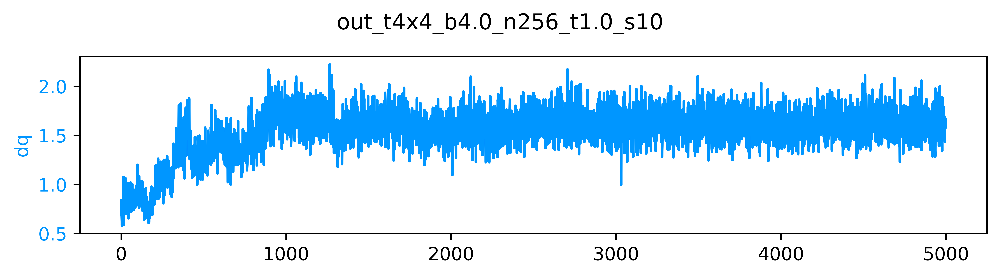

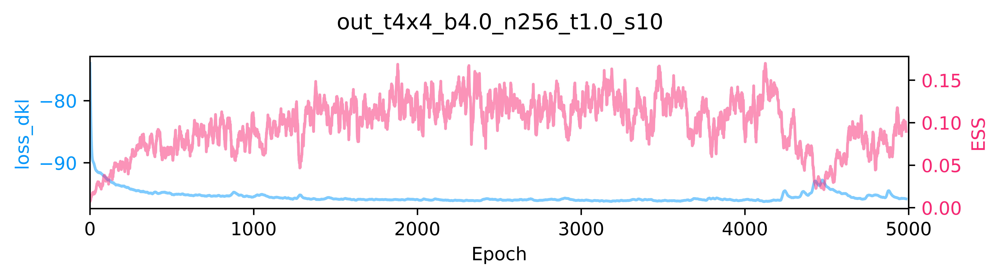

[17:30:53]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[17:31:08]  epoch=97.000 step=0.000 dt=0.139 loss=-92.1167 dq=1.01172 ess=0.0404891          
            plaq=0.73667 loss_dkl=-92.1167 logp=47.1469 logq=-44.9698

[17:31:10]  ---------------------------------------                                          
            ERA=1, last took: 0 min 16.13 s                                                  
            ---------------------------------------

[17:31:24]  epoch=97.000 step=97.000 dt=0.138 loss=-93.785 dq=0.885156 ess=0.0525403         
            plaq=0.771701 loss_dkl=-93.785 logp=49.3888 logq=-44.3961

[17:31:26]  ---------------------------------------                                          
            ERA=2, last took: 0 min 15.94 s                                                  
            ---------------------------------------

[17:31:39]  epoch=97.000 step=194.000 dt=0.138 loss=-94.4836 dq=1.08125 ess=0.0727359        
            plaq=0.789886 loss_dkl=-94.4836 logp=50.5527 logq=-43.9309

[17:31:41]  ---------------------------------------                                          
            ERA=3, last took: 0 min 15.87 s                                                  
            ---------------------------------------

[17:31:55]  epoch=97.000 step=291.000 dt=0.138 loss=-94.8046 dq=1.62891 ess=0.0673501        
            plaq=0.794084 loss_dkl=-94.8046 logp=50.8214 logq=-43.9832

[17:31:57]  ---------------------------------------                                          
            ERA=4, last took: 0 min 15.85 s                                                  
            ---------------------------------------

[17:32:11]  epoch=97.000 step=388.000 dt=0.139 loss=-94.6817 dq=1.29141 ess=0.0616399        
            plaq=0.798591 loss_dkl=-94.6817 logp=51.1099 logq=-43.5719

[17:32:13]  ---------------------------------------                                          
            ERA=5, last took: 0 min 15.84 s                                                  
            ---------------------------------------

[17:32:27]  epoch=97.000 step=485.000 dt=0.138 loss=-95.2114 dq=1.46875 ess=0.0800312        
            plaq=0.809511 loss_dkl=-95.2114 logp=51.8087 logq=-43.4027

[17:32:29]  ---------------------------------------                                          
            ERA=6, last took: 0 min 15.84 s                                                  
            ---------------------------------------

[17:32:43]  epoch=97.000 step=582.000 dt=0.139 loss=-95.3658 dq=1.35547 ess=0.100381         
            plaq=0.809397 loss_dkl=-95.3658 logp=51.8014 logq=-43.5644

[17:32:45]  ---------------------------------------                                          
            ERA=7, last took: 0 min 15.86 s                                                  
            ---------------------------------------

[17:32:59]  epoch=97.000 step=679.000 dt=0.138 loss=-95.3067 dq=1.43125 ess=0.102308         
            plaq=0.806354 loss_dkl=-95.3067 logp=51.6066 logq=-43.7001

[17:33:01]  ---------------------------------------                                          
            ERA=8, last took: 0 min 15.88 s                                                  
            ---------------------------------------

[17:33:15]  epoch=97.000 step=776.000 dt=0.138 loss=-94.9149 dq=1.84219 ess=0.0585861        
            plaq=0.811369 loss_dkl=-94.9149 logp=51.9276 logq=-42.9873

[17:33:17]  ---------------------------------------                                          
            ERA=9, last took: 0 min 15.85 s                                                  
            ---------------------------------------

[17:33:30]  epoch=97.000 step=873.000 dt=0.139 loss=-95.547 dq=1.65937 ess=0.110575          
            plaq=0.809132 loss_dkl=-95.547 logp=51.7845 logq=-43.7625

[17:33:32]  ---------------------------------------                                          
            ERA=10, last took: 0 min 15.87 s                                                 
            ---------------------------------------

[17:33:46]  epoch=97.000 step=970.000 dt=0.138 loss=-95.4625 dq=1.75234 ess=0.0963299        
            plaq=0.809636 loss_dkl=-95.4625 logp=51.8167 logq=-43.6458

[17:33:48]  ---------------------------------------                                          
            ERA=11, last took: 0 min 15.89 s                                                 
            ---------------------------------------

[17:34:02]  epoch=97.000 step=1067.000 dt=0.138 loss=-95.4868 dq=1.75625 ess=0.10021         
            plaq=0.814735 loss_dkl=-95.4868 logp=52.1431 logq=-43.3437

[17:34:04]  ---------------------------------------                                          
            ERA=12, last took: 0 min 15.97 s                                                 
            ---------------------------------------

[17:34:18]  epoch=97.000 step=1164.000 dt=0.138 loss=-95.3381 dq=1.5625 ess=0.0477754        
            plaq=0.816978 loss_dkl=-95.3381 logp=52.2866 logq=-43.0515

[17:34:20]  ---------------------------------------                                          
            ERA=13, last took: 0 min 15.92 s                                                 
            ---------------------------------------

[17:34:34]  epoch=97.000 step=1261.000 dt=0.138 loss=-95.9455 dq=1.64141 ess=0.0995878       
            plaq=0.825931 loss_dkl=-95.9455 logp=52.8596 logq=-43.0859

[17:34:36]  ---------------------------------------                                          
            ERA=14, last took: 0 min 15.93 s                                                 
            ---------------------------------------

[17:34:50]  epoch=97.000 step=1358.000 dt=0.138 loss=-95.8252 dq=1.64766 ess=0.127228        
            plaq=0.821266 loss_dkl=-95.8252 logp=52.561 logq=-43.2642

[17:34:52]  ---------------------------------------                                          
            ERA=15, last took: 0 min 15.96 s                                                 
            ---------------------------------------

[17:35:06]  epoch=97.000 step=1455.000 dt=0.139 loss=-95.8978 dq=1.74531 ess=0.135596        
            plaq=0.820951 loss_dkl=-95.8978 logp=52.5408 logq=-43.3569

[17:35:08]  ---------------------------------------                                          
            ERA=16, last took: 0 min 15.96 s                                                 
            ---------------------------------------

[17:35:22]  epoch=97.000 step=1552.000 dt=0.139 loss=-96.0072 dq=1.61953 ess=0.106209        
            plaq=0.829209 loss_dkl=-96.0072 logp=53.0694 logq=-42.9379

[17:35:24]  ---------------------------------------                                          
            ERA=17, last took: 0 min 15.95 s                                                 
            ---------------------------------------

[17:35:38]  epoch=97.000 step=1649.000 dt=0.139 loss=-95.9087 dq=1.60391 ess=0.107368        
            plaq=0.822841 loss_dkl=-95.9087 logp=52.6618 logq=-43.2469

[17:35:40]  ---------------------------------------                                          
            ERA=18, last took: 0 min 15.98 s                                                 
            ---------------------------------------

[17:35:54]  epoch=97.000 step=1746.000 dt=0.139 loss=-96.0071 dq=1.57187 ess=0.114076        
            plaq=0.818152 loss_dkl=-96.0071 logp=52.3617 logq=-43.6453

[17:35:56]  ---------------------------------------                                          
            ERA=19, last took: 0 min 16.01 s                                                 
            ---------------------------------------

[17:36:10]  epoch=97.000 step=1843.000 dt=0.139 loss=-96.0048 dq=1.51797 ess=0.0849973       
            plaq=0.82646 loss_dkl=-96.0048 logp=52.8934 logq=-43.1114

[17:36:12]  ---------------------------------------                                          
            ERA=20, last took: 0 min 16 s                                                    
            ---------------------------------------

[17:36:26]  epoch=97.000 step=1940.000 dt=0.139 loss=-96.0531 dq=1.56172 ess=0.175967        
            plaq=0.823903 loss_dkl=-96.0531 logp=52.7298 logq=-43.3233

[17:36:28]  ---------------------------------------                                          
            ERA=21, last took: 0 min 15.98 s                                                 
            ---------------------------------------

[17:36:42]  epoch=97.000 step=2037.000 dt=0.139 loss=-95.9878 dq=1.55 ess=0.100758           
            plaq=0.82898 loss_dkl=-95.9878 logp=53.0547 logq=-42.9331

[17:36:44]  ---------------------------------------                                          
            ERA=22, last took: 0 min 16.02 s                                                 
            ---------------------------------------

[17:36:58]  epoch=97.000 step=2134.000 dt=0.139 loss=-96.0279 dq=1.49297 ess=0.113211        
            plaq=0.827245 loss_dkl=-96.0279 logp=52.9437 logq=-43.0842

[17:37:00]  ---------------------------------------                                          
            ERA=23, last took: 0 min 16.04 s                                                 
            ---------------------------------------

[17:37:14]  epoch=97.000 step=2231.000 dt=0.139 loss=-96.1335 dq=1.56328 ess=0.106998        
            plaq=0.832705 loss_dkl=-96.1335 logp=53.2931 logq=-42.8403

[17:37:16]  ---------------------------------------                                          
            ERA=24, last took: 0 min 16.02 s                                                 
            ---------------------------------------

[17:37:30]  epoch=97.000 step=2328.000 dt=0.141 loss=-96.0064 dq=1.66562 ess=0.0539466       
            plaq=0.830111 loss_dkl=-96.0064 logp=53.1271 logq=-42.8793

[17:37:32]  ---------------------------------------                                          
            ERA=25, last took: 0 min 16.05 s                                                 
            ---------------------------------------

[17:37:46]  epoch=97.000 step=2425.000 dt=0.138 loss=-95.9335 dq=1.70312 ess=0.135381        
            plaq=0.823862 loss_dkl=-95.9335 logp=52.7272 logq=-43.2064

[17:37:48]  ---------------------------------------                                          
            ERA=26, last took: 0 min 16.01 s                                                 
            ---------------------------------------

[17:38:02]  epoch=97.000 step=2522.000 dt=0.139 loss=-95.8436 dq=1.70703 ess=0.138372        
            plaq=0.824767 loss_dkl=-95.8436 logp=52.7851 logq=-43.0585

[17:38:04]  ---------------------------------------                                          
            ERA=27, last took: 0 min 16.01 s                                                 
            ---------------------------------------

[17:38:18]  epoch=97.000 step=2619.000 dt=0.139 loss=-95.8883 dq=1.68438 ess=0.12852         
            plaq=0.828016 loss_dkl=-95.8883 logp=52.993 logq=-42.8952

[17:38:20]  ---------------------------------------                                          
            ERA=28, last took: 0 min 16.05 s                                                 
            ---------------------------------------

[17:38:34]  epoch=97.000 step=2716.000 dt=0.139 loss=-95.8175 dq=1.64375 ess=0.123036        
            plaq=0.828827 loss_dkl=-95.8175 logp=53.0449 logq=-42.7726

[17:38:36]  ---------------------------------------                                          
            ERA=29, last took: 0 min 16.02 s                                                 
            ---------------------------------------

[17:38:50]  epoch=97.000 step=2813.000 dt=0.138 loss=-96.004 dq=1.61172 ess=0.0886193        
            plaq=0.835364 loss_dkl=-96.004 logp=53.4633 logq=-42.5407

[17:38:52]  ---------------------------------------                                          
            ERA=30, last took: 0 min 16.06 s                                                 
            ---------------------------------------

[17:39:06]  epoch=97.000 step=2910.000 dt=0.139 loss=-96.1049 dq=1.52344 ess=0.127601        
            plaq=0.831481 loss_dkl=-96.1049 logp=53.2148 logq=-42.8901

[17:39:08]  ---------------------------------------                                          
            ERA=31, last took: 0 min 16.07 s                                                 
            ---------------------------------------

[17:39:22]  epoch=97.000 step=3007.000 dt=0.139 loss=-96.148 dq=1.58516 ess=0.155492         
            plaq=0.832603 loss_dkl=-96.148 logp=53.2866 logq=-42.8615

[17:39:24]  ---------------------------------------                                          
            ERA=32, last took: 0 min 16.07 s                                                 
            ---------------------------------------

[17:39:38]  epoch=97.000 step=3104.000 dt=0.139 loss=-96.1485 dq=1.57969 ess=0.0878992       
            plaq=0.835555 loss_dkl=-96.1485 logp=53.4755 logq=-42.6729

[17:39:40]  ---------------------------------------                                          
            ERA=33, last took: 0 min 16.08 s                                                 
            ---------------------------------------

[17:39:54]  epoch=97.000 step=3201.000 dt=0.139 loss=-95.8221 dq=1.63125 ess=0.151068        
            plaq=0.831522 loss_dkl=-95.8221 logp=53.2174 logq=-42.6047

[17:39:57]  ---------------------------------------                                          
            ERA=34, last took: 0 min 16.12 s                                                 
            ---------------------------------------

[17:40:11]  epoch=97.000 step=3298.000 dt=0.139 loss=-96.1621 dq=1.71172 ess=0.151812        
            plaq=0.836383 loss_dkl=-96.1621 logp=53.5285 logq=-42.6336

[17:40:13]  ---------------------------------------                                          
            ERA=35, last took: 0 min 16.17 s                                                 
            ---------------------------------------

[17:40:27]  epoch=97.000 step=3395.000 dt=0.139 loss=-96.1829 dq=1.56875 ess=0.147707        
            plaq=0.832239 loss_dkl=-96.1829 logp=53.2633 logq=-42.9196

[17:40:29]  ---------------------------------------                                          
            ERA=36, last took: 0 min 16.12 s                                                 
            ---------------------------------------

[17:40:43]  epoch=97.000 step=3492.000 dt=0.139 loss=-95.6508 dq=1.69062 ess=0.0774217       
            plaq=0.832412 loss_dkl=-95.6508 logp=53.2744 logq=-42.3765

[17:40:45]  ---------------------------------------                                          
            ERA=37, last took: 0 min 16.12 s                                                 
            ---------------------------------------

[17:40:59]  epoch=97.000 step=3589.000 dt=0.139 loss=-95.7539 dq=1.61406 ess=0.0725044       
            plaq=0.834068 loss_dkl=-95.7539 logp=53.3803 logq=-42.3736

[17:41:01]  ---------------------------------------                                          
            ERA=38, last took: 0 min 16.15 s                                                 
            ---------------------------------------

[17:41:15]  epoch=97.000 step=3686.000 dt=0.139 loss=-95.9524 dq=1.58906 ess=0.0971851       
            plaq=0.836975 loss_dkl=-95.9524 logp=53.5664 logq=-42.386

[17:41:17]  ---------------------------------------                                          
            ERA=39, last took: 0 min 16.16 s                                                 
            ---------------------------------------

[17:41:31]  epoch=97.000 step=3783.000 dt=0.139 loss=-95.997 dq=1.61172 ess=0.114003         
            plaq=0.833139 loss_dkl=-95.997 logp=53.3209 logq=-42.6761

[17:41:33]  ---------------------------------------                                          
            ERA=40, last took: 0 min 16.18 s                                                 
            ---------------------------------------

[17:41:47]  epoch=97.000 step=3880.000 dt=0.139 loss=-96.184 dq=1.62969 ess=0.0881689        
            plaq=0.836581 loss_dkl=-96.184 logp=53.5412 logq=-42.6428

[17:41:50]  ---------------------------------------                                          
            ERA=41, last took: 0 min 16.15 s                                                 
            ---------------------------------------

[17:42:04]  epoch=97.000 step=3977.000 dt=0.139 loss=-96.0997 dq=1.51328 ess=0.129589        
            plaq=0.833667 loss_dkl=-96.0997 logp=53.3547 logq=-42.745

[17:42:06]  ---------------------------------------                                          
            ERA=42, last took: 0 min 16.17 s                                                 
            ---------------------------------------

[17:42:20]  epoch=97.000 step=4074.000 dt=0.139 loss=-95.6382 dq=1.72812 ess=0.0915143       
            plaq=0.831496 loss_dkl=-95.6382 logp=53.2158 logq=-42.4224

[17:42:22]  ---------------------------------------                                          
            ERA=43, last took: 0 min 16.19 s                                                 
            ---------------------------------------

[17:42:36]  epoch=97.000 step=4171.000 dt=0.139 loss=-95.2709 dq=1.5375 ess=0.0758031        
            plaq=0.831683 loss_dkl=-95.2709 logp=53.2277 logq=-42.0432

[17:42:38]  ---------------------------------------                                          
            ERA=44, last took: 0 min 16.17 s                                                 
            ---------------------------------------

[17:42:52]  epoch=97.000 step=4268.000 dt=0.139 loss=-93.5222 dq=1.67891 ess=0.0404027       
            plaq=0.826737 loss_dkl=-93.5222 logp=52.9112 logq=-40.6111

[17:42:54]  ---------------------------------------                                          
            ERA=45, last took: 0 min 16.18 s                                                 
            ---------------------------------------

[17:43:08]  epoch=97.000 step=4365.000 dt=0.139 loss=-94.9842 dq=1.60312 ess=0.055798        
            plaq=0.829868 loss_dkl=-94.9842 logp=53.1116 logq=-41.8726

[17:43:11]  ---------------------------------------                                          
            ERA=46, last took: 0 min 16.21 s                                                 
            ---------------------------------------

[17:43:25]  epoch=97.000 step=4462.000 dt=0.139 loss=-95.7698 dq=1.65781 ess=0.0994528       
            plaq=0.835162 loss_dkl=-95.7698 logp=53.4504 logq=-42.3194

[17:43:27]  ---------------------------------------                                          
            ERA=47, last took: 0 min 16.22 s                                                 
            ---------------------------------------

[17:43:41]  epoch=97.000 step=4559.000 dt=0.139 loss=-95.2076 dq=1.62969 ess=0.0675312       
            plaq=0.833435 loss_dkl=-95.2076 logp=53.3398 logq=-41.8678

[17:43:43]  ---------------------------------------                                          
            ERA=48, last took: 0 min 16.24 s                                                 
            ---------------------------------------

[17:43:57]  epoch=97.000 step=4656.000 dt=0.139 loss=-94.9192 dq=1.65078 ess=0.0498042       
            plaq=0.831508 loss_dkl=-94.9192 logp=53.2165 logq=-41.7028

[17:43:59]  ---------------------------------------                                          
            ERA=49, last took: 0 min 16.26 s                                                 
            ---------------------------------------

[17:44:13]  epoch=97.000 step=4753.000 dt=0.139 loss=-95.8596 dq=1.60469 ess=0.0814036       
            plaq=0.834874 loss_dkl=-95.8596 logp=53.4319 logq=-42.4276

[17:44:15]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1730

[17:44:15]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/out_t4x4_b4.0_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1730/pre_flow_m
            odel.tar

[17:44:16]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730

[17:44:16]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/dq_tra
            ining.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/loss_d
            kl_ess_training.pdf

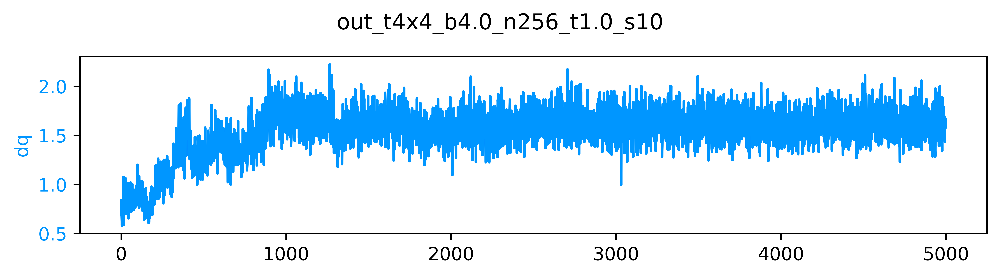

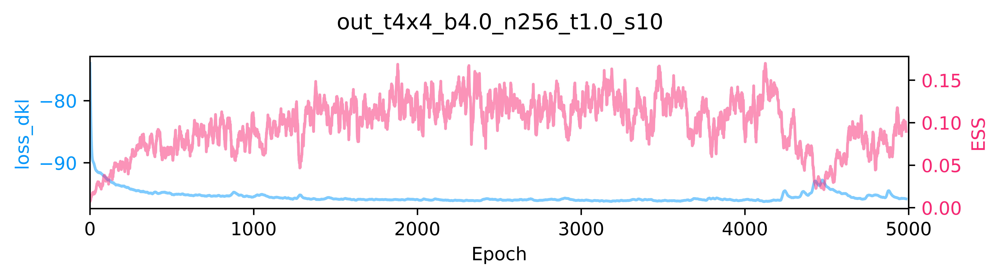

In [5]:
train_outputs = train(param,
                      train_config,
                      #model=train_outputs['model'],
                      pre_model=None,
                      logger=logger,
                      figsize=(7.5, 2))
 
pre_flow_plots = train_outputs['plots']
pre_flow_history = train_outputs['history']
flow_act = train_outputs['action']

pre_flow_model = train_outputs['model']
pre_flow_optimizer = train_outputs['optimizer_kdl']

step = train_config.n_era * train_config.n_epoch
outfile = os.path.join(MODEL_DIR, 'pre_flow_model', TSTAMP, 'pre_flow_model.tar')

io.save_checkpoint(
    epoch=step,
    outfile=outfile,
    model=train_outputs['model']['layers'],
    optimizer=pre_flow_optimizer,
    history=train_outputs['history'],
    overwrite=True,
)

plots = train_outputs['plots']
outdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)

save_live_plots(plots, outdir)

[17:49:47]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-174947

[17:49:47]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-1730

[17:49:47]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/step.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/dt.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/loss.p
            df

[17:49:48]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/dq.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/ess.pd
            f

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/plaq.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/loss_d
            kl.pdf

[17:49:49]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/logp.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/logq.p
            df

[17:49:49]  Saving train_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthm
            c/logs/out_t4x4_b4.0_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-173
            0/train_metrics.z.

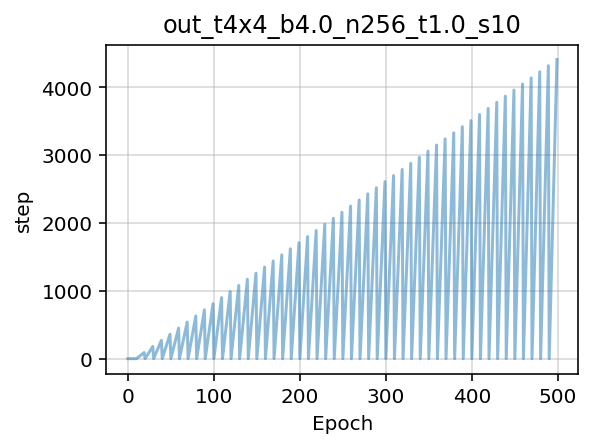

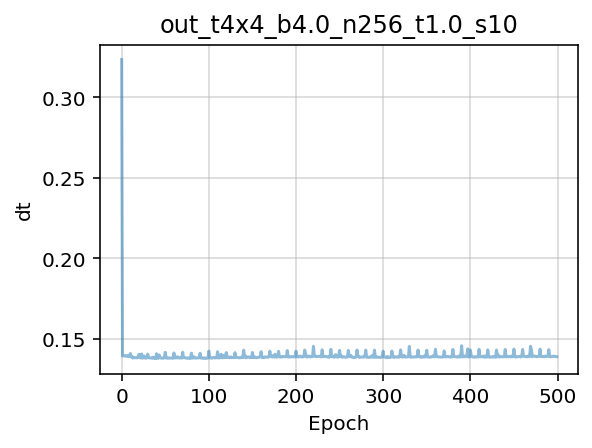

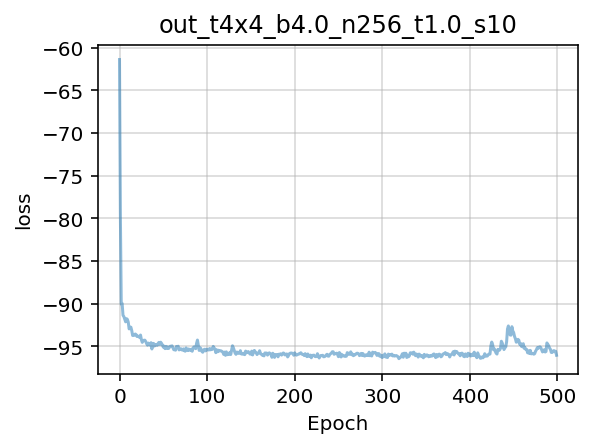

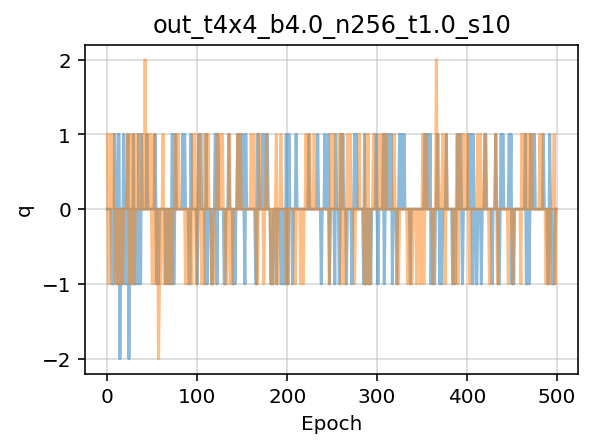

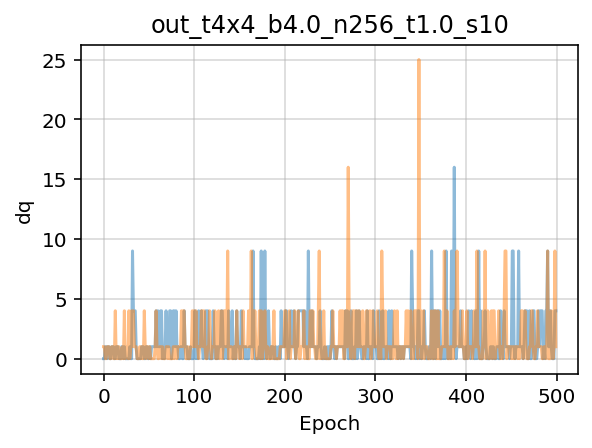

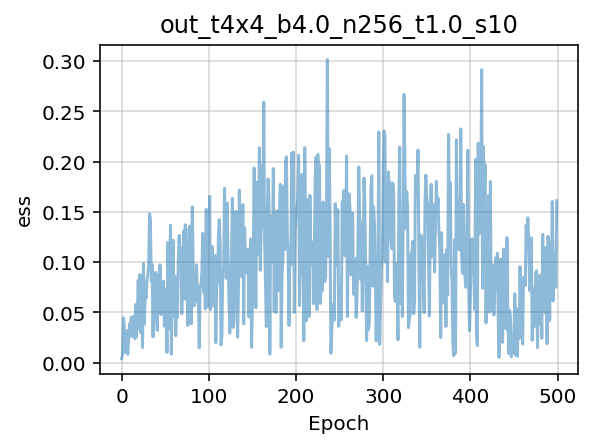

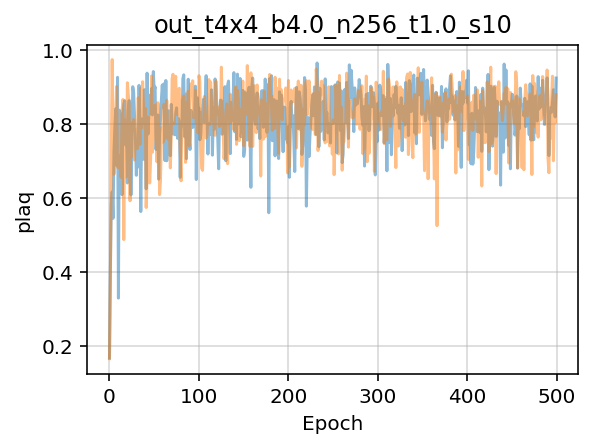

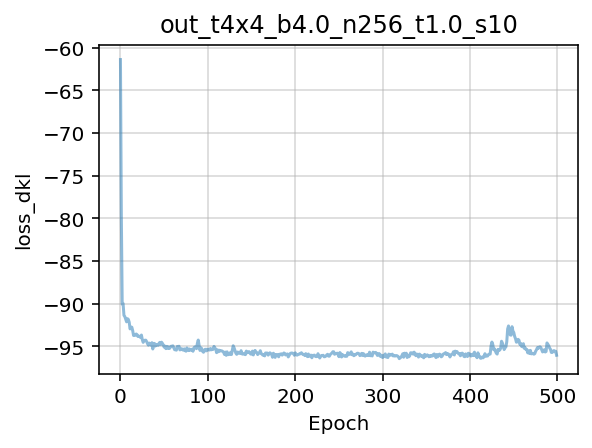

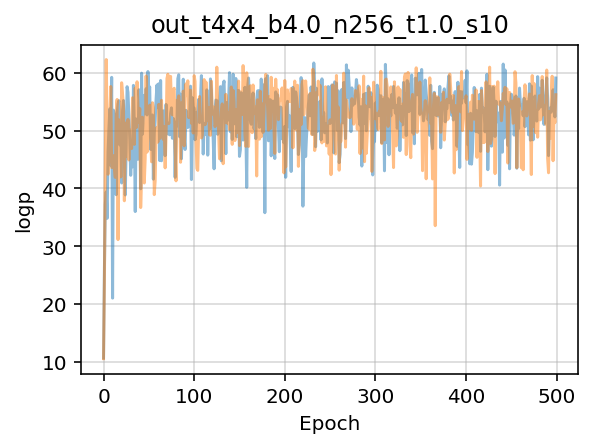

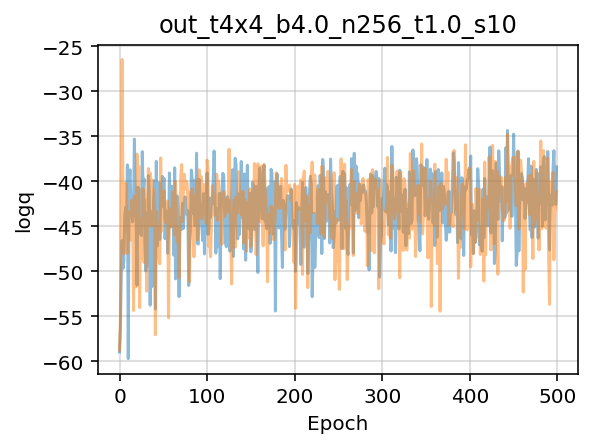

In [6]:
import matplotlib.pyplot as plt

from fthmc.utils.plot_helpers import plot_history

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', tstamp)
    
mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', tstamp)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=train_outputs['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=outdir, alpha=0.5)

mfile = os.path.join(mdir, 'train_metrics.z')
io.save_history(train_outputs['history'], mfile, name='train_metrics')

## Run inference on trained model and plot history

[17:51:59]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730

[17:51:59]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/plots/ inference/pre_flow_model/2021-06-08-1730

[17:51:59]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/ess.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/q.pdf

[17:52:00]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/dqsq.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/dkl.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/logq.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/logp.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-1730/accep
            ted.pdf

[17:52:00]  Saving inference_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/
            fthmc/logs/out_t4x4_b4.0_n256_t1.0_s10/plots/                                    
            inference/pre_flow_model/2021-06-08-1730/inference_metrics.z.

[17:52:01]  Accept rate: 0.177

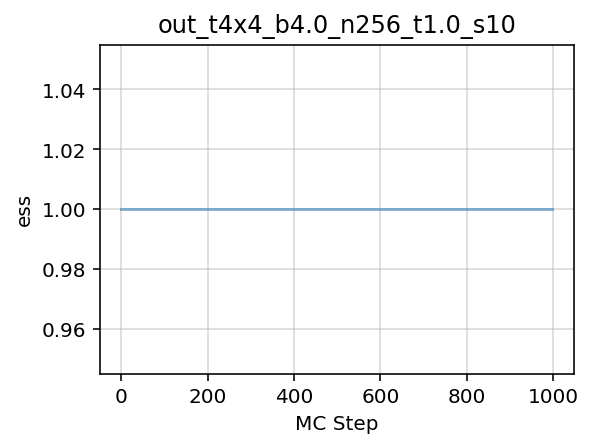

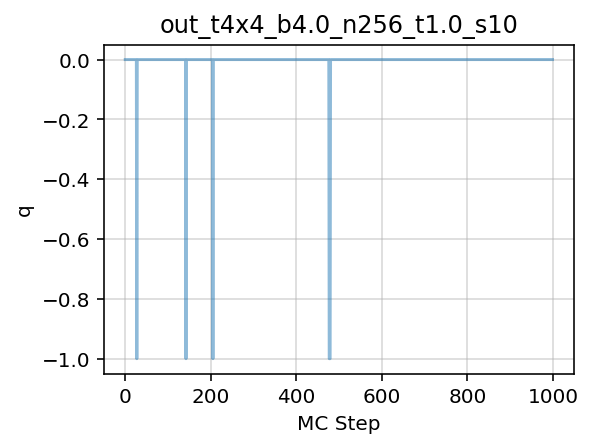

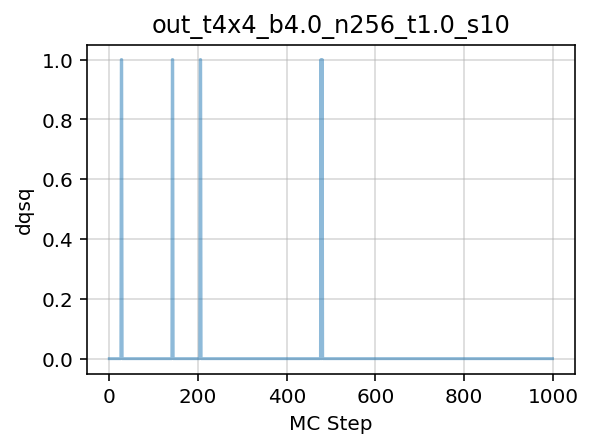

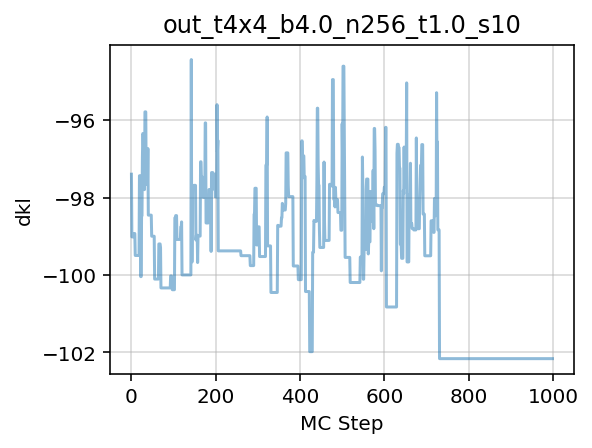

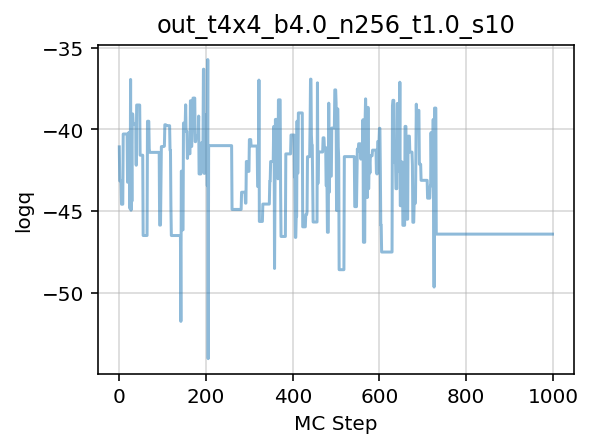

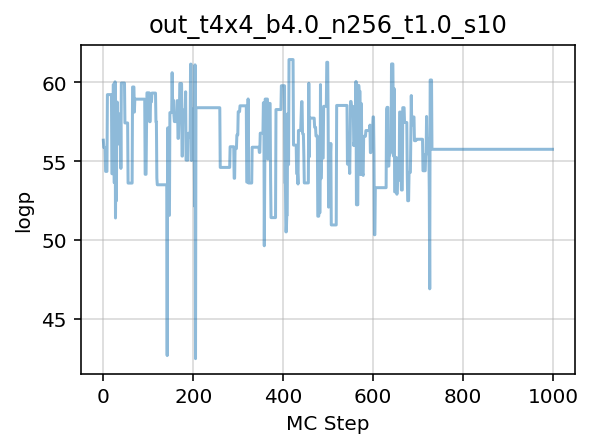

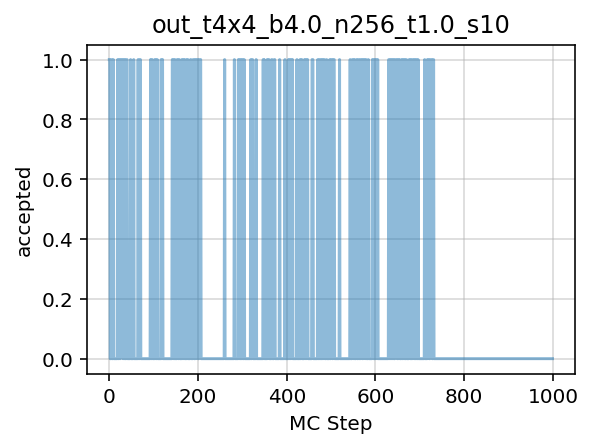

In [8]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

history = make_mcmc_ensemble(model=train_outputs['model'],
                             action_fn=train_outputs['action'],
                             batch_size=train_config.batch_size,
                             num_samples=1000)

pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'inference', 'pre_flow_model', tstamp)
    
mdir = os.path.join(PLOTS_DIR,' inference', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'inference', 'pre_flow_model', TSTAMP)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=history,
             param=param, skip=['epoch', 'x'],
             num_chains=2, therm_frac=0.0,#, thin=10,
             xlabel='MC Step', outdir=pdir, alpha=0.5)

mfile = os.path.join(mdir, 'inference_metrics.z')

io.save_history(history, mfile, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [9]:
from fthmc.config import grab

#for key, val in history.items():
#    #x = grab(val)
#    if key == 'x':
#        continue
#        
#    logger.log(f'({key}) shape: {val.shape}, mean: {np.mean(val)}')
np.mean(history['accepted'])
#np.mean(history['accepted'])

0.177

In [10]:
from fthmc.utils.samplers import generate_ensemble

outputs = generate_ensemble(pre_flow_model, flow_act, logger=logger)

history = outputs['history']
#u1_ens = outputs['ensemble']

pre_flow = pre_flow_model['layers']

[17:52:11]  accept_rate=0.2353515625

            top_susceptibility=0.02372 +/- 0.00675

[17:52:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175213

[17:52:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.0_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-175213

[17:52:13]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/ste
            p_175213.pdf

[17:52:13]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/step_1
            75213.pdf

[17:52:13]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/dt_
            175213.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/dt_175
            213.pdf

[17:52:14]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/los
            s_175214.pdf

[17:52:14]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/loss_1
            75214.pdf

[17:52:14]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/q_1
            75214.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/q_1752
            14.pdf

[17:52:14]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/dq_
            175214.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/dq_175
            214.pdf

[17:52:14]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/ess
            _175214.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/ess_17
            5214.pdf

[17:52:14]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/pla
            q_175214.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/plaq_1
            75214.pdf

[17:52:15]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/los
            s_dkl_175215.pdf

[17:52:15]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/loss_d
            kl_175215.pdf

[17:52:15]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/log
            p_175215.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/logp_1
            75215.pdf

[17:52:15]  Existing file found!                                                             
            Renaming outfile to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/l
            ogs/out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/log
            q_175215.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.0_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1730/logq_1
            75215.pdf

[17:52:15]  Saving train_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthm
            c/logs/out_t4x4_b4.0_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-175
            213/train_metrics.z.

KeyboardInterrupt: 

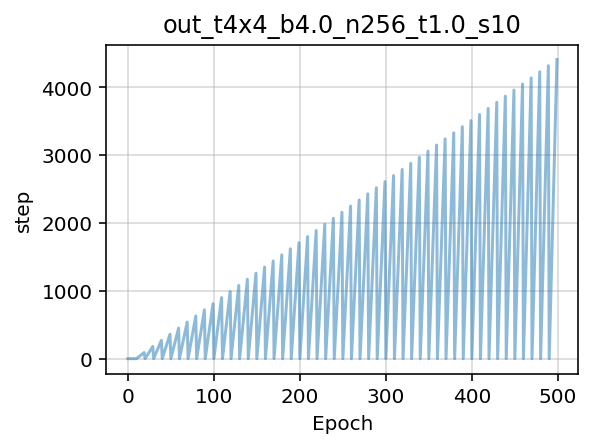

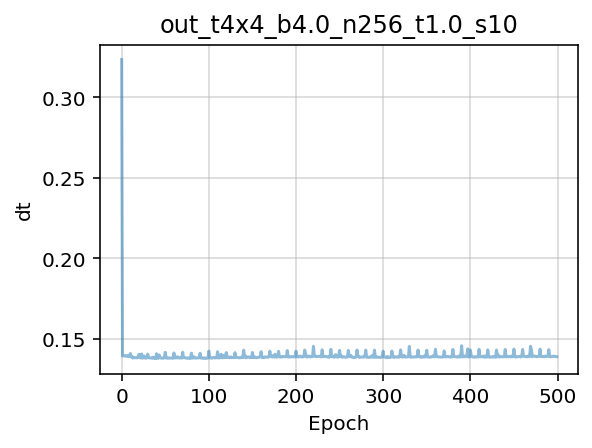

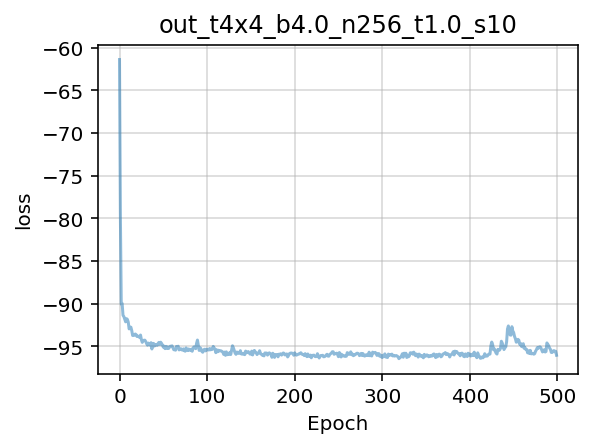

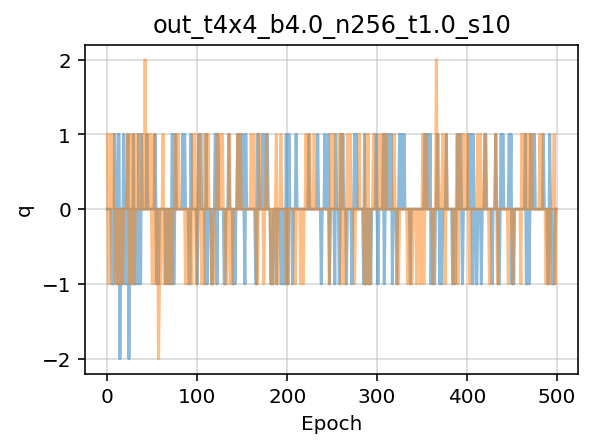

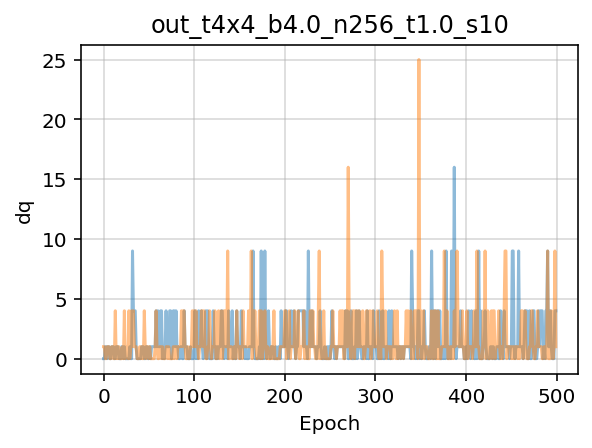

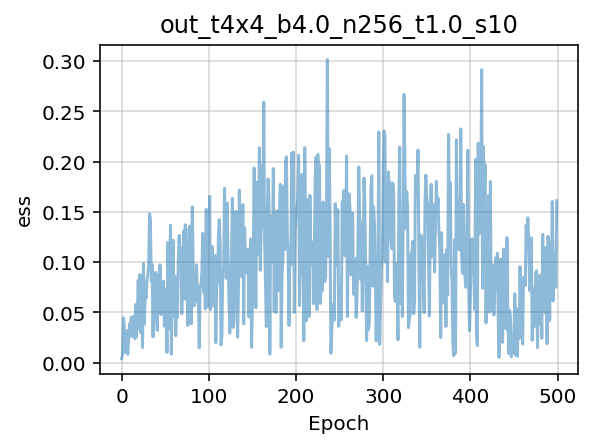

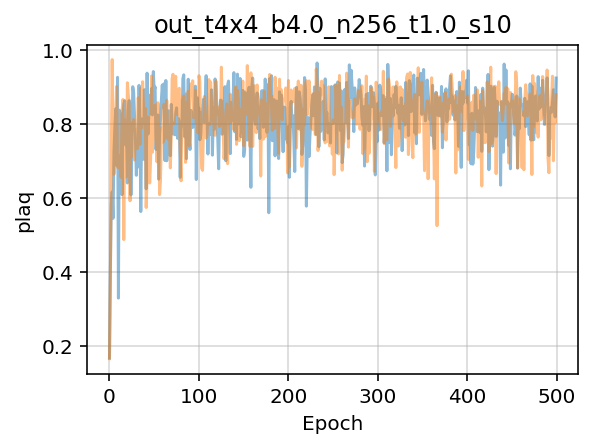

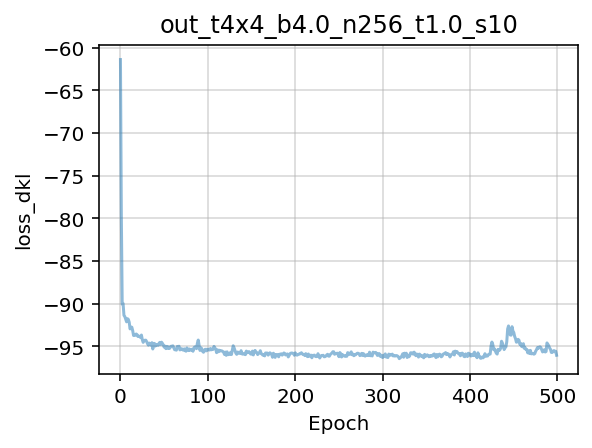

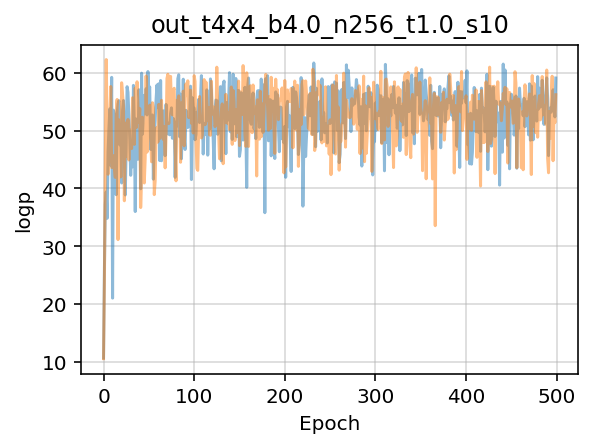

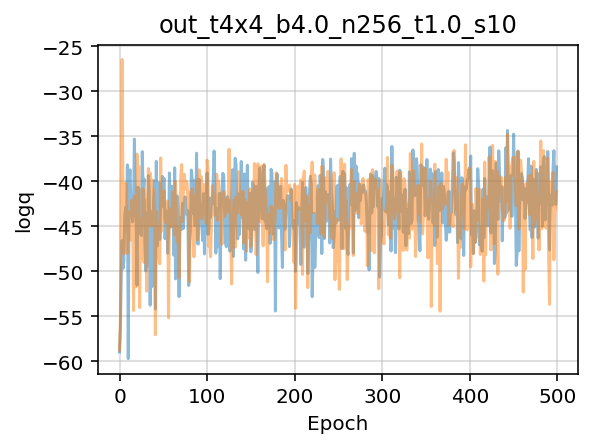

In [11]:
import matplotlib.pyplot as plt

from fthmc.utils.plot_helpers import plot_history

tstamp = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(pdir):
    pdir = os.path.join(PLOTS_DIR, 'training', 'pre_flow_model', tstamp)
    
mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', TSTAMP)
if os.path.isdir(mdir):
    mdir = os.path.join(METRICS_DIR, 'training', 'pre_flow_model', tstamp)
    
io.check_else_make_dir(pdir)
io.check_else_make_dir(mdir)

plot_history(history=train_outputs['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=outdir, alpha=0.5)

mfile = os.path.join(mdir, 'train_metrics.z')
io.save_history(train_outputs['history'], mfile, name='train_metrics')

In [12]:
train_force = False
flow_model = None

if train_force:
    flow_model, flow_act = flow_train(param, with_force=True, pre_model=pre_flow_model)
else:
    flow_model = pre_flow_model
    
u1_ens = generate_ensemble(flow_model, flow_act, logger=logger)
flow = flow_model['layers']
flow.eval()

[17:52:20]  accept_rate=0.1376953125

            top_susceptibility=0.02362 +/- 0.01007

ModuleList(
  (0): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (1): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLayer(
      (net): Sequential(
        (0): Conv2d(2, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (1): SiLU()
        (2): Conv2d(8, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
        (3): SiLU()
        (4): Conv2d(8, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), padding_mode=circular)
      )
    )
  )
  (2): GaugeEquivCouplingLayer(
    (plaq_coupling): NCPPlaqCouplingLaye

# Try increasing $\beta$ on `4x4` lattice

[17:52:39]  Param:                                                                           
            ----------------                                                                 
            beta=4.5                                                                         
            L=4                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[4, 4]                                                                       
            nd=2                                                                             
            shape=[2, 4, 4]                                                                  
            volume=16                                                                        
            dt=0.1

[17:52:39]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10

[17:52:39]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/models

[17:52:39]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/metrics

[17:52:39]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/plots

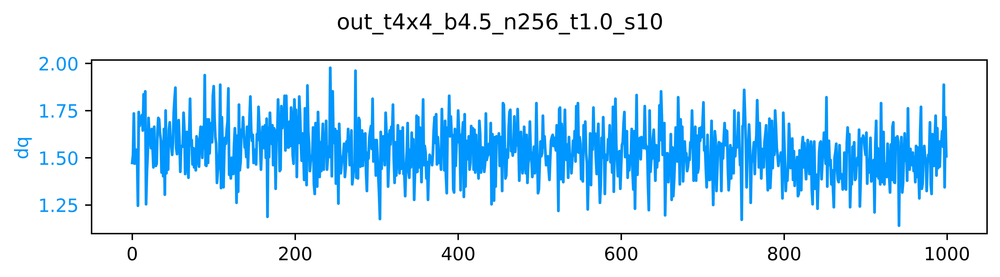

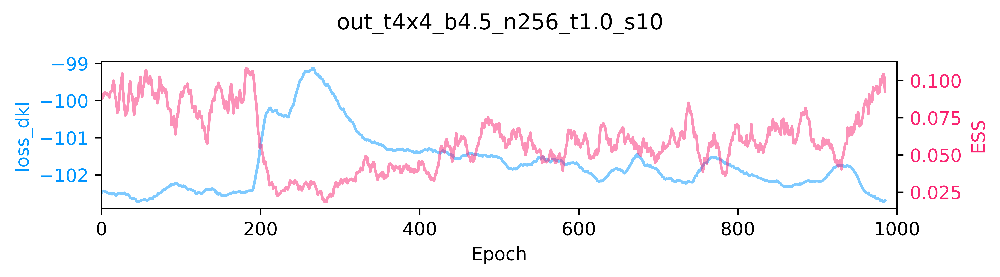

[17:52:41]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[17:52:55]  epoch=97.000 step=0.000 dt=0.138 loss=-102.197 dq=1.65469 ess=0.0593313          
            plaq=0.846854 loss_dkl=-102.197 logp=60.9735 logq=-41.2232

[17:52:56]  ---------------------------------------                                          
            ERA=1, last took: 0 min 15.79 s                                                  
            ---------------------------------------

[17:53:10]  epoch=97.000 step=97.000 dt=0.138 loss=-102.331 dq=1.65469 ess=0.114545          
            plaq=0.840753 loss_dkl=-102.331 logp=60.5342 logq=-41.7966

[17:53:12]  ---------------------------------------                                          
            ERA=2, last took: 0 min 15.86 s                                                  
            ---------------------------------------

[17:53:26]  epoch=97.000 step=194.000 dt=0.138 loss=-99.6948 dq=1.57734 ess=0.031886         
            plaq=0.849467 loss_dkl=-99.6948 logp=61.1616 logq=-38.5332

[17:53:28]  ---------------------------------------                                          
            ERA=3, last took: 0 min 15.88 s                                                  
            ---------------------------------------

[17:53:42]  epoch=97.000 step=291.000 dt=0.137 loss=-101.36 dq=1.51797 ess=0.029906          
            plaq=0.846599 loss_dkl=-101.36 logp=60.9551 logq=-40.405

[17:53:44]  ---------------------------------------                                          
            ERA=4, last took: 0 min 15.82 s                                                  
            ---------------------------------------

[17:53:58]  epoch=97.000 step=388.000 dt=0.136 loss=-101.517 dq=1.49219 ess=0.0611839        
            plaq=0.851672 loss_dkl=-101.517 logp=61.3204 logq=-40.1965

[17:54:00]  ---------------------------------------                                          
            ERA=5, last took: 0 min 15.72 s                                                  
            ---------------------------------------

[17:54:13]  epoch=97.000 step=485.000 dt=0.136 loss=-101.699 dq=1.45703 ess=0.0909918        
            plaq=0.850273 loss_dkl=-101.699 logp=61.2196 logq=-40.4793

[17:54:15]  ---------------------------------------                                          
            ERA=6, last took: 0 min 15.74 s                                                  
            ---------------------------------------

[17:54:29]  epoch=97.000 step=582.000 dt=0.137 loss=-101.831 dq=1.59219 ess=0.0552301        
            plaq=0.847837 loss_dkl=-101.831 logp=61.0443 logq=-40.7872

[17:54:31]  ---------------------------------------                                          
            ERA=7, last took: 0 min 15.78 s                                                  
            ---------------------------------------

[17:54:45]  epoch=97.000 step=679.000 dt=0.136 loss=-101.723 dq=1.50391 ess=0.0477211        
            plaq=0.851465 loss_dkl=-101.723 logp=61.3055 logq=-40.4175

[17:54:47]  ---------------------------------------                                          
            ERA=8, last took: 0 min 15.8 s                                                   
            ---------------------------------------

[17:55:01]  epoch=97.000 step=776.000 dt=0.137 loss=-102.114 dq=1.58984 ess=0.0718534        
            plaq=0.850345 loss_dkl=-102.114 logp=61.2249 logq=-40.8893

[17:55:03]  ---------------------------------------                                          
            ERA=9, last took: 0 min 15.8 s                                                   
            ---------------------------------------

[17:55:17]  epoch=97.000 step=873.000 dt=0.137 loss=-102.646 dq=1.60234 ess=0.0595918        
            plaq=0.850079 loss_dkl=-102.646 logp=61.2057 logq=-41.4398

[17:55:19]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1752

[17:55:19]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/out_t4x4_b4.5_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1752/pre_flow_m
            odel.tar

[17:55:19]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1752

[17:55:19]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1752/dq_tra
            ining.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1752/loss_d
            kl_ess_training.pdf

[17:55:19]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519

[17:55:19]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-1752

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/step
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/dt.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/loss
            .pdf

[17:55:20]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/q.pd
            f

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/dq.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/ess.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/plaq
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/loss
            _dkl.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/logp
            .pdf

[17:55:21]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-175519/logq
            .pdf

[17:55:21]  Saving train_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthm
            c/logs/out_t4x4_b4.5_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-175
            2/train_metrics.z.

[17:55:26]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519

[17:55:26]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t4x4_b4.5_n256_t1.0_s10/metrics/inference/pre_flow_model/2021-06-08-1752

[17:55:26]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/ess
            .pdf

[17:55:27]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/q.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/dqs
            q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/dkl
            .pdf

[17:55:28]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/log
            q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/log
            p.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t4x4_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-175519/acc
            epted.pdf

[17:55:28]  Saving inference_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/
            fthmc/logs/out_t4x4_b4.5_n256_t1.0_s10/metrics/inference/pre_flow_model/2021-06-0
            8-1752/inference_metrics.z.

[17:55:34]  Accept rate: 0.2353515625

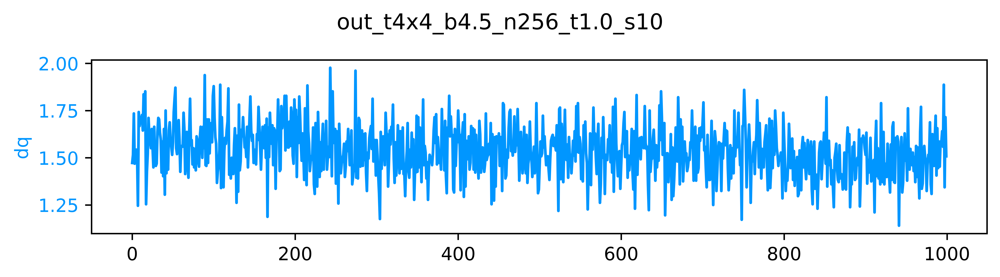

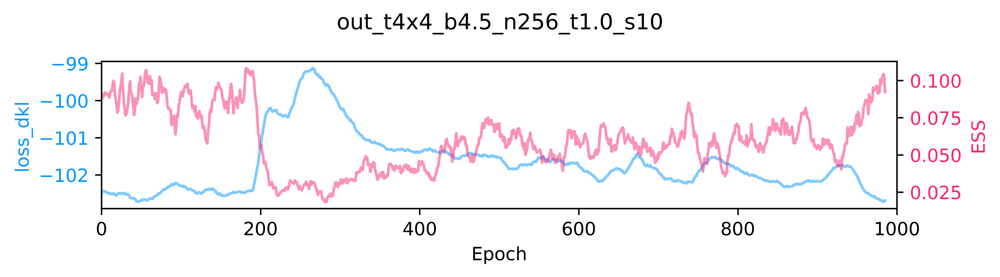

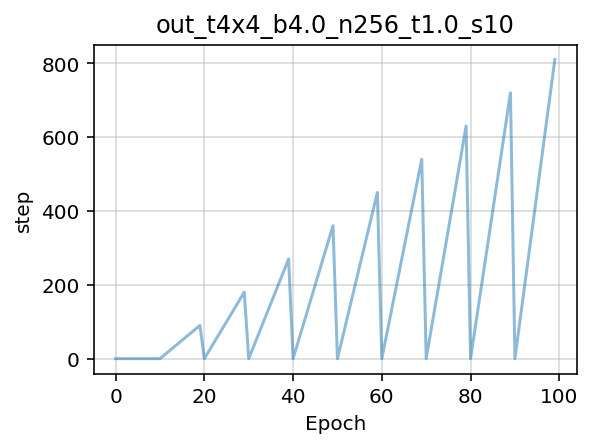

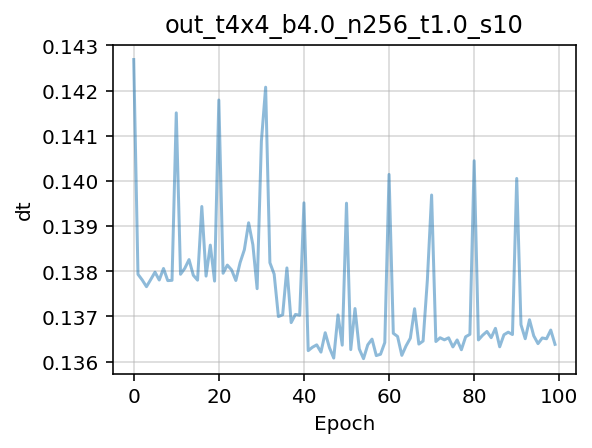

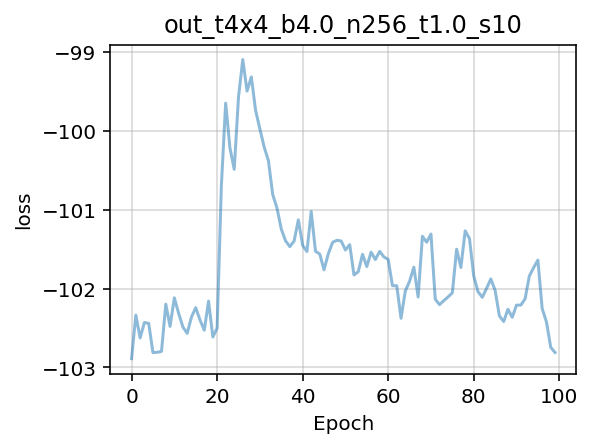

...

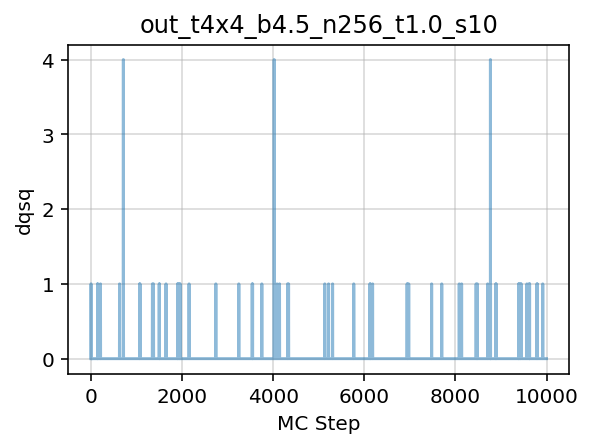

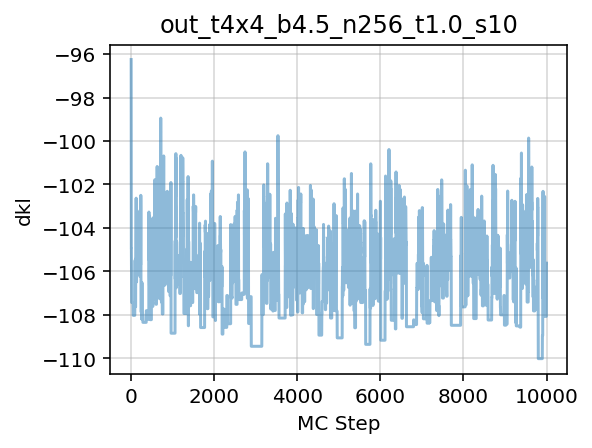

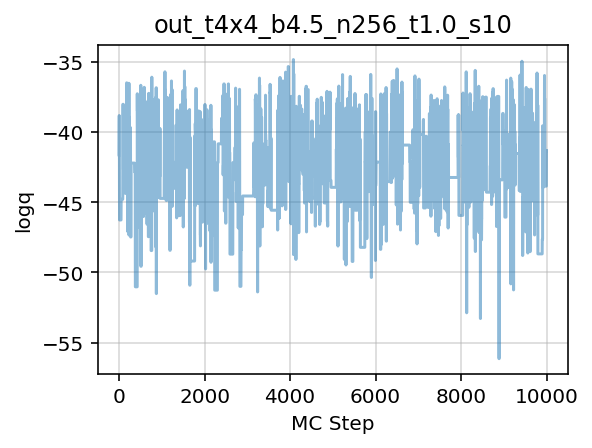

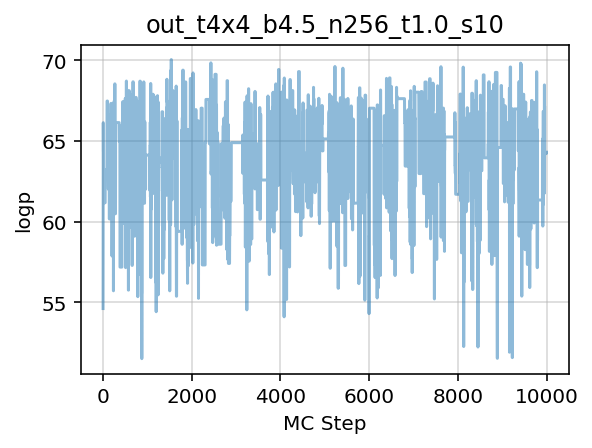

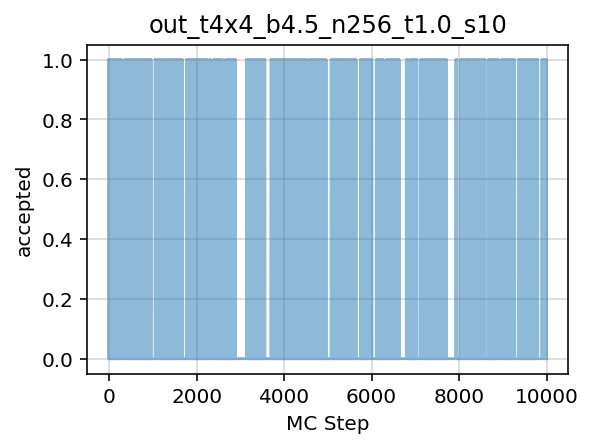

In [13]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history

param4 = Param(**{
    'L': 4,
    'tau': 1.,
    'nrun': 5,
    'beta': 4.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 100,
    'seed': 1331,
})

logger.log(repr(param4))

flow4 = make_net_from_layers(lattice_shape=tuple(param.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config4 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior4 = MultivariateUniform(torch.zeros((2, *param4.lat)),
                              2. * PI * torch.ones(tuple(param4.lat)))

model4 = {'layers': flow4, 'prior': prior4}

DAYSTR4 = io.get_timestamp('%Y-%m-%d')
NOW4 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP4 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR4 = os.path.join(LOGS_DIR,
                           param4.uniquestr())
METRICS_DIR4 = os.path.join(PARAM_DIR4, 'metrics')
MODEL_DIR4 = os.path.join(PARAM_DIR4, 'models')
PLOTS_DIR4 = os.path.join(PARAM_DIR4, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR4)
io.check_else_make_dir(MODEL_DIR4)
io.check_else_make_dir(METRICS_DIR4)
io.check_else_make_dir(PLOTS_DIR4)

train_outputs4 = train(param4,
                        train_config4,
                        model=model4,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots4 = train_outputs4['plots']
pre_flow_history4 = train_outputs4['history']
flow_act4 = train_outputs4['action']

pre_flow_model4 = train_outputs4['model']
pre_flow_optimizer4 = train_outputs4['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step4 = train_config4.n_era * train_config4.n_epoch

outfile4 = os.path.join(MODEL_DIR4, 'pre_flow_model', TSTAMP4, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step4,
    outfile=outfile4,
    model=pre_flow_model4['layers'],
    optimizer=pre_flow_optimizer4,
    history=train_outputs4['history'],
    overwrite=True,
)

plots4 = train_outputs4['plots']
outdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', TSTAMP4)

save_live_plots(plots4, outdir4)


tstamp4 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', TSTAMP4)
if os.path.isdir(pdir4):
    pdir4 = os.path.join(PLOTS_DIR4, 'training', 'pre_flow_model', tstamp4)
    
mdir4 = os.path.join(METRICS_DIR4, 'training', 'pre_flow_model', TSTAMP4)
if os.path.isdir(mdir4):
    mdir4 = os.path.join(METRICS_DIR4, 'training', 'pre_flow_model', tstamp4)
    
io.check_else_make_dir(pdir4)
io.check_else_make_dir(mdir4)

plot_history(history=train_outputs4['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir4, alpha=0.5)

mfile4 = os.path.join(mdir4, 'train_metrics.z')
io.save_history(train_outputs4['history'], mfile4, name='train_metrics')


history4 = make_mcmc_ensemble(model=train_outputs4['model'],
                               action_fn=train_outputs4['action'],
                               batch_size=train_config4.batch_size,
                               num_samples=10000)

pdir4 = os.path.join(PLOTS_DIR4, 'inference', 'pre_flow_model', TSTAMP4)
if os.path.isdir(pdir):
    pdir4 = os.path.join(PLOTS_DIR4, 'inference', 'pre_flow_model', tstamp4)
    
mdir4 = os.path.join(PLOTS_DIR4,'inference', 'pre_flow_model', TSTAMP4)
if os.path.isdir(mdir):
    mdir4 = os.path.join(METRICS_DIR4, 'inference', 'pre_flow_model', TSTAMP4)
    
io.check_else_make_dir(pdir4)
io.check_else_make_dir(mdir4)

plot_history(history=history4,
             param=param4,
             outdir=pdir4,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile4 = os.path.join(mdir4, 'inference_metrics.z')

io.save_history(history4, mfile4, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

## Extract layers from `pre_flow_model` and transfer learning to larger lattice

## Transfer up to $8\times8$ lattice

In [14]:
logger.log(repr(param))
logger.log(train_config)

[17:56:10]  Param:                                                                           
            ----------------                                                                 
            beta=4.0                                                                         
            L=4                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[4, 4]                                                                       
            nd=2                                                                             
            shape=[2, 4, 4]                                                                  
            volume=16                                                                        
            dt=0.1

            TrainConfig(                                                                     
                n_era=50,                                                                    
                n_epoch=100,                                                                 
                n_layers=24,                                                                 
                n_s_nets=2,                                                                  
                hidden_sizes=[8, 8],                                                         
                kernel_size=3,                                                               
                base_lr=0.001,                                                               
                batch_size=256,                                                              
                print_freq=100,                                                              
                plot_freq=100,                                                               
                with_force=False                                                             
            )

[17:57:32]  Param:                                                                           
            ----------------                                                                 
            beta=4.5                                                                         
            L=8                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.1

            Param:                                                                           
            ----------------                                                                 
            beta=4.5                                                                         
            L=8                                                                              
            tau=1.0                                                                          
            nstep=10                                                                         
            ntraj=256                                                                        
            nrun=5                                                                           
            nprint=100                                                                       
            seed=1331                                                                        
            randinit=False                                                                   
            nth=2                                                                            
            nth_interop=2                                                                    
            lat=[8, 8]                                                                       
            nd=2                                                                             
            shape=[2, 8, 8]                                                                  
            volume=64                                                                        
            dt=0.1

[17:57:32]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10

[17:57:32]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/models

[17:57:32]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/metrics

[17:57:32]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/plots

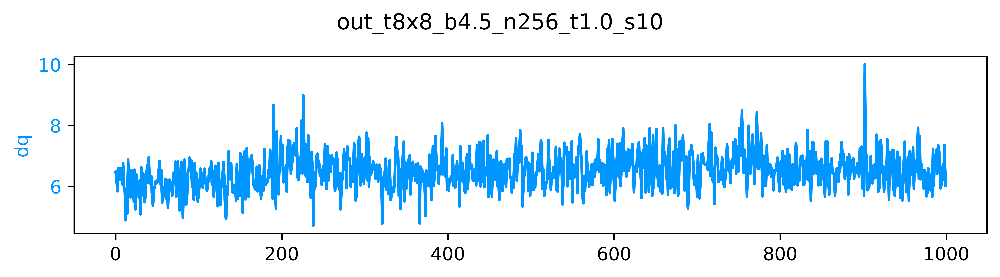

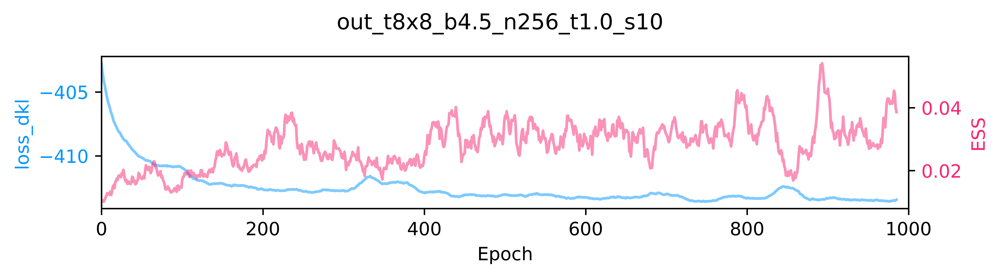

[17:57:34]  ---------------------------------------                                          
            ERA=0, last took: 0 min 0 s                                                      
            ---------------------------------------

[17:57:48]  epoch=97.000 step=0.000 dt=0.138 loss=-410.738 dq=6.14062 ess=0.0160448          
            plaq=0.854433 loss_dkl=-410.738 logp=246.077 logq=-164.661

[17:57:50]  ---------------------------------------                                          
            ERA=1, last took: 0 min 15.79 s                                                  
            ---------------------------------------

[17:58:03]  epoch=97.000 step=97.000 dt=0.138 loss=-412.487 dq=6.43906 ess=0.0198629         
            plaq=0.856063 loss_dkl=-412.487 logp=246.546 logq=-165.94

[17:58:05]  ---------------------------------------                                          
            ERA=2, last took: 0 min 15.88 s                                                  
            ---------------------------------------

[17:58:19]  epoch=97.000 step=194.000 dt=0.138 loss=-412.831 dq=6.41641 ess=0.0235801        
            plaq=0.857793 loss_dkl=-412.831 logp=247.044 logq=-165.786

[17:58:21]  ---------------------------------------                                          
            ERA=3, last took: 0 min 15.8 s                                                   
            ---------------------------------------

[17:58:35]  epoch=97.000 step=291.000 dt=0.138 loss=-412.494 dq=6.6125 ess=0.019567          
            plaq=0.857948 loss_dkl=-412.494 logp=247.089 logq=-165.405

[17:58:37]  ---------------------------------------                                          
            ERA=4, last took: 0 min 15.87 s                                                  
            ---------------------------------------

[17:58:51]  epoch=97.000 step=388.000 dt=0.138 loss=-413.279 dq=6.38672 ess=0.0266166        
            plaq=0.859804 loss_dkl=-413.279 logp=247.624 logq=-165.655

[17:58:53]  ---------------------------------------                                          
            ERA=5, last took: 0 min 15.89 s                                                  
            ---------------------------------------

[17:59:07]  epoch=97.000 step=485.000 dt=0.138 loss=-413.305 dq=6.66563 ess=0.0212893        
            plaq=0.857857 loss_dkl=-413.305 logp=247.063 logq=-166.242

[17:59:09]  ---------------------------------------                                          
            ERA=6, last took: 0 min 15.91 s                                                  
            ---------------------------------------

[17:59:23]  epoch=97.000 step=582.000 dt=0.138 loss=-413.194 dq=6.34922 ess=0.042596         
            plaq=0.861468 loss_dkl=-413.194 logp=248.103 logq=-165.092

[17:59:25]  ---------------------------------------                                          
            ERA=7, last took: 0 min 15.89 s                                                  
            ---------------------------------------

[17:59:39]  epoch=97.000 step=679.000 dt=0.138 loss=-413.158 dq=6.48203 ess=0.0505137        
            plaq=0.858899 loss_dkl=-413.158 logp=247.363 logq=-165.795

[17:59:41]  ---------------------------------------                                          
            ERA=8, last took: 0 min 15.95 s                                                  
            ---------------------------------------

[17:59:55]  epoch=97.000 step=776.000 dt=0.138 loss=-413.491 dq=6.725 ess=0.0397762          
            plaq=0.859165 loss_dkl=-413.491 logp=247.44 logq=-166.052

[17:59:57]  ---------------------------------------                                          
            ERA=9, last took: 0 min 15.91 s                                                  
            ---------------------------------------

[18:00:11]  epoch=97.000 step=873.000 dt=0.138 loss=-413.377 dq=6.53438 ess=0.0431807        
            plaq=0.86034 loss_dkl=-413.377 logp=247.778 logq=-165.6

[18:00:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1757

[18:00:13]  Saving checkpoint to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/
            logs/out_t8x8_b4.5_n256_t1.0_s10/models/pre_flow_model/2021-06-08-1757/pre_flow_m
            odel.tar

[18:00:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1757

[18:00:13]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1757/dq_tra
            ining.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-1757/loss_d
            kl_ess_training.pdf

[18:00:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013

[18:00:13]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-1757

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/step
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/dt.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/loss
            .pdf

[18:00:14]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/q.pd
            f

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/dq.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/ess.
            pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/plaq
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/loss
            _dkl.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/logp
            .pdf

[18:00:15]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/training/pre_flow_model/2021-06-08-180013/logq
            .pdf

[18:00:15]  Saving train_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthm
            c/logs/out_t8x8_b4.5_n256_t1.0_s10/metrics/training/pre_flow_model/2021-06-08-175
            7/train_metrics.z.

[18:00:20]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013

[18:00:20]  Creating directory: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/lo
            gs/out_t8x8_b4.5_n256_t1.0_s10/metrics/inference/pre_flow_model/2021-06-08-1757

[18:00:21]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/ess
            .pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/q.p
            df

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/dqs
            q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/dkl
            .pdf

[18:00:22]  Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/log
            q.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/log
            p.pdf

            Saving figure to: /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/fthmc/logs
            /out_t8x8_b4.5_n256_t1.0_s10/plots/inference/pre_flow_model/2021-06-08-180013/acc
            epted.pdf

[18:00:22]  Saving inference_metrics to /gpfs/jlse-fs0/projects/datascience/foremans1/nftqcd/
            fthmc/logs/out_t8x8_b4.5_n256_t1.0_s10/metrics/inference/pre_flow_model/2021-06-0
            8-1757/inference_metrics.z.

[18:00:27]  Accept rate: 0.2353515625

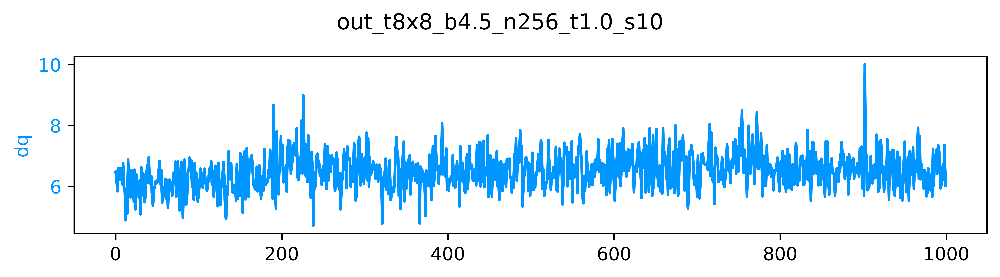

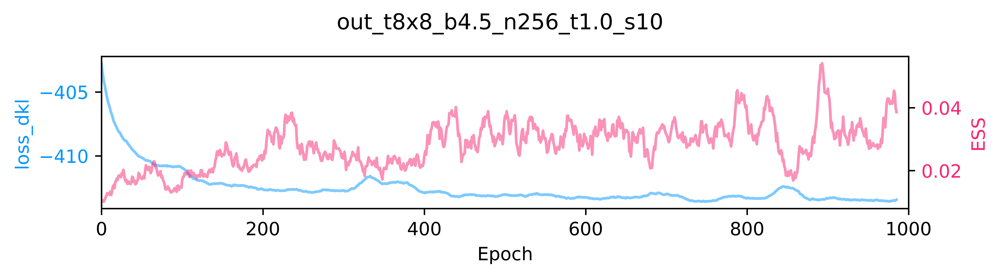

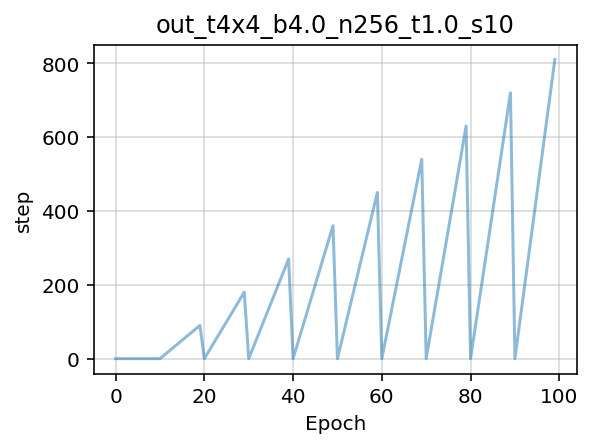

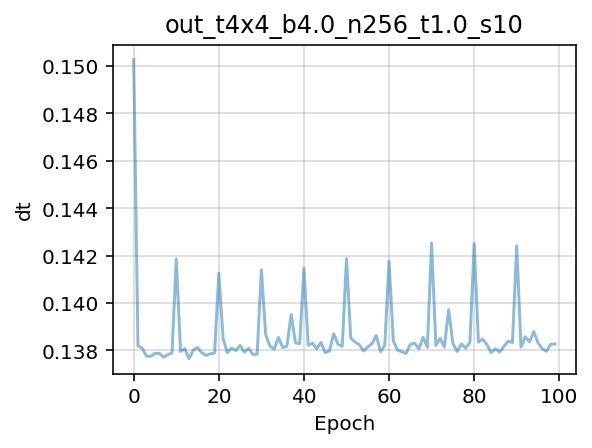

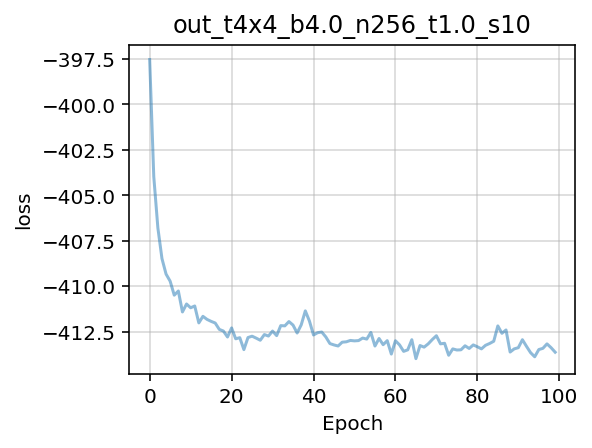

...

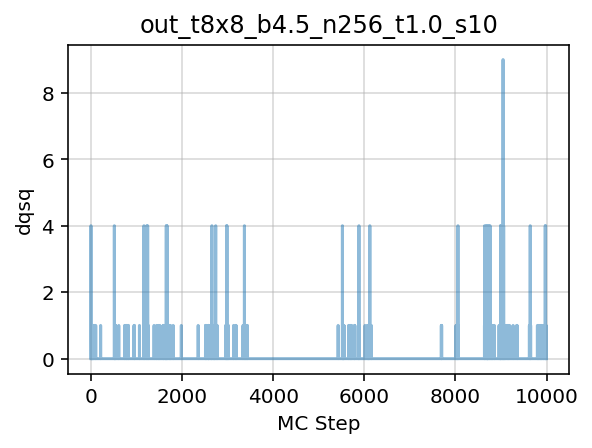

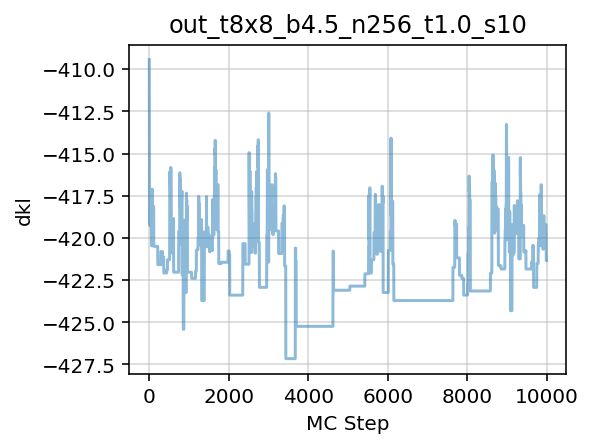

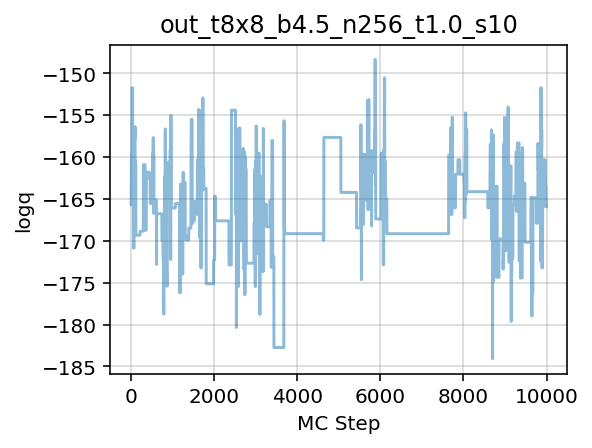

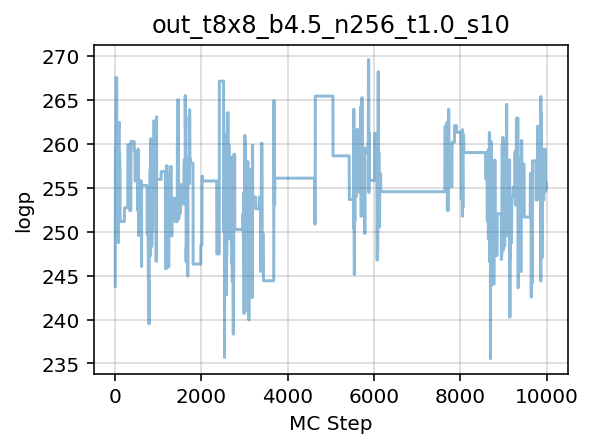

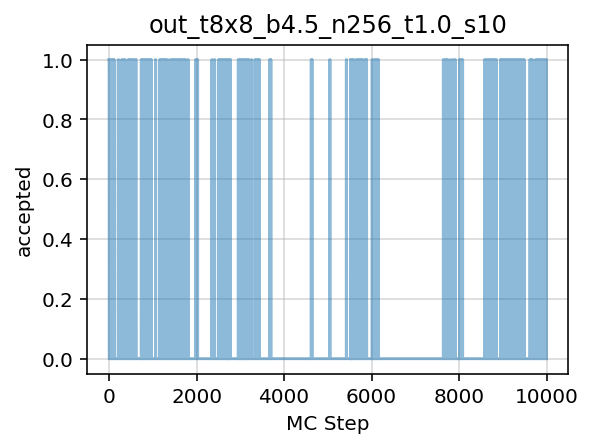

In [15]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history

param8 = Param(**{
    'L': 8,
    'tau': 1.,
    'nrun': 5,
    'beta': 4.5,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 100,
    'seed': 1331,
})

logger.log(repr(param8))

flow8 = make_net_from_layers(lattice_shape=tuple(param8.lat),
                             nets=get_nets(pre_flow_model['layers']))


train_config8 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})
logger.log(repr(param8))

prior8 = MultivariateUniform(torch.zeros((2, *param8.lat)),
                              2. * PI * torch.ones(tuple(param8.lat)))

model8 = {'layers': flow8, 'prior': prior8}

DAYSTR8 = io.get_timestamp('%Y-%m-%d')
NOW8 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8 = os.path.join(LOGS_DIR,
                           param8.uniquestr())
METRICS_DIR8 = os.path.join(PARAM_DIR8, 'metrics')
MODEL_DIR8 = os.path.join(PARAM_DIR8, 'models')
PLOTS_DIR8 = os.path.join(PARAM_DIR8, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8)
io.check_else_make_dir(MODEL_DIR8)
io.check_else_make_dir(METRICS_DIR8)
io.check_else_make_dir(PLOTS_DIR8)

train_outputs8 = train(param8,
                        train_config8,
                        model=model8,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8 = train_outputs8['plots']
pre_flow_history8 = train_outputs8['history']
flow_act8 = train_outputs8['action']

pre_flow_model8 = train_outputs8['model']
pre_flow_optimizer8 = train_outputs8['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8 = train_config8.n_era * train_config8.n_epoch

outfile8 = os.path.join(MODEL_DIR8, 'pre_flow_model', TSTAMP8, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8,
    outfile=outfile8,
    model=pre_flow_model8['layers'],
    optimizer=pre_flow_optimizer8,
    history=train_outputs8['history'],
    overwrite=True,
)

plots8 = train_outputs8['plots']
outdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)

save_live_plots(plots8, outdir8)


tstamp8 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir8):
    pdir8 = os.path.join(PLOTS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir8):
    mdir8 = os.path.join(METRICS_DIR8, 'training', 'pre_flow_model', tstamp8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=train_outputs8['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8, alpha=0.5)

mfile8 = os.path.join(mdir8, 'train_metrics.z')
io.save_history(train_outputs8['history'], mfile8, name='train_metrics')


history8 = make_mcmc_ensemble(model=train_outputs8['model'],
                               action_fn=train_outputs8['action'],
                               batch_size=train_config8.batch_size,
                               num_samples=10000)

pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(pdir):
    pdir8 = os.path.join(PLOTS_DIR8, 'inference', 'pre_flow_model', tstamp8)
    
mdir8 = os.path.join(PLOTS_DIR8,'inference', 'pre_flow_model', TSTAMP8)
if os.path.isdir(mdir):
    mdir8 = os.path.join(METRICS_DIR8, 'inference', 'pre_flow_model', TSTAMP8)
    
io.check_else_make_dir(pdir8)
io.check_else_make_dir(mdir8)

plot_history(history=history8,
             param=param8,
             outdir=pdir8,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8 = os.path.join(mdir8, 'inference_metrics.z')

io.save_history(history8, mfile8, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Try increasing $\beta$, using previously trained `8x8` network

In [ ]:
param8_1 = Param(
    beta=3.,
    L=8,
    tau=0.5,
    nstep=10,
    ntraj=256,
    nrun=5,
    nprint=100,
    seed=1331,
    randinit=False,
    nth=2,
    nth_interop=2,
)

logger.log(repr(param8_1))

flow8_1 = make_net_from_layers(lattice_shape=tuple(param8_1.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config8_1 = TrainConfig(
    n_era=10,
    n_epoch=100,
    n_layers=24,
    n_s_nets=2,
    hidden_sizes=[8, 8],
    kernel_size=3,
    base_lr=0.001,
    batch_size=64,
    print_freq=10,
    plot_freq=10,
    with_force=False,
)

prior8_1 = MultivariateUniform(torch.zeros((2, *param8_1.lat)),
                              2. * PI * torch.ones(tuple(param8_1.lat)))

model8_1 = {'layers': flow8_1, 'prior': prior8_1}

DAYSTR8_1 = io.get_timestamp('%Y-%m-%d')
NOW8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8_1 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8_1 = os.path.join(LOGS_DIR,
                           param8_1.uniquestr())
METRICS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'metrics')
MODEL_DIR8_1 = os.path.join(PARAM_DIR8_1, 'models')
PLOTS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8_1)
io.check_else_make_dir(MODEL_DIR8_1)
io.check_else_make_dir(METRICS_DIR8_1)
io.check_else_make_dir(PLOTS_DIR8_1)

train_outputs8_1 = train(param8_1,
                        train_config8_1,
                        model=model8_1,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8_1 = train_outputs8_1['plots']
pre_flow_history8_1 = train_outputs8_1['history']
flow_act8_1 = train_outputs8_1['action']

pre_flow_model8_1 = train_outputs8_1['model']
pre_flow_optimizer8_1 = train_outputs8_1['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8_1 = train_config8_1.n_era * train_config8_1.n_epoch

outfile8_1 = os.path.join(MODEL_DIR8_1, 'pre_flow_model', TSTAMP8_1, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8_1,
    outfile=outfile8_1,
    model=pre_flow_model8_1['layers'],
    optimizer=pre_flow_optimizer8_1,
    history=train_outputs8_1['history'],
    overwrite=True,
)

plots8_1 = train_outputs8_1['plots']
outdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)

save_live_plots(plots8_1, outdir8_1)


tstamp8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir8_1):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir8_1):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=train_outputs8_1['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8_1, alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'train_metrics.z')
io.save_history(train_outputs8_1['history'], mfile8_1, name='train_metrics')


history8_1 = make_mcmc_ensemble(model=train_outputs8_1['model'],
                               action_fn=train_outputs8_1['action'],
                               batch_size=train_config8_1.batch_size,
                               num_samples=10000)

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(PLOTS_DIR8_1,'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=history8_1,
             param=param8_1,
             outdir=pdir8_1,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'inference_metrics.z')

io.save_history(history8_1, mfile8_1, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Try increasing $\beta$ again...

In [ ]:
param8_1 = Param(
    beta=3.,
    L=8,
    tau=0.5,
    nstep=10,
    ntraj=256,
    nrun=5,
    nprint=100,
    seed=1331,
    randinit=False,
    nth=2,
    nth_interop=2,
)

logger.log(repr(param8_1))

flow8_1 = make_net_from_layers(lattice_shape=tuple(param8_1.lat),
                              nets=get_nets(pre_flow_model['layers']))


train_config8_1 = TrainConfig(
    n_era=10,
    n_epoch=100,
    n_layers=24,
    n_s_nets=2,
    hidden_sizes=[8, 8],
    kernel_size=3,
    base_lr=0.001,
    batch_size=64,
    print_freq=10,
    plot_freq=10,
    with_force=False,
)

prior8_1 = MultivariateUniform(torch.zeros((2, *param8_1.lat)),
                              2. * PI * torch.ones(tuple(param8_1.lat)))

model8_1 = {'layers': flow8_1, 'prior': prior8_1}

DAYSTR8_1 = io.get_timestamp('%Y-%m-%d')
NOW8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP8_1 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR8_1 = os.path.join(LOGS_DIR,
                           param8_1.uniquestr())
METRICS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'metrics')
MODEL_DIR8_1 = os.path.join(PARAM_DIR8_1, 'models')
PLOTS_DIR8_1 = os.path.join(PARAM_DIR8_1, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR8_1)
io.check_else_make_dir(MODEL_DIR8_1)
io.check_else_make_dir(METRICS_DIR8_1)
io.check_else_make_dir(PLOTS_DIR8_1)

train_outputs8_1 = train(param8_1,
                        train_config8_1,
                        model=model8_1,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots8_1 = train_outputs8_1['plots']
pre_flow_history8_1 = train_outputs8_1['history']
flow_act8_1 = train_outputs8_1['action']

pre_flow_model8_1 = train_outputs8_1['model']
pre_flow_optimizer8_1 = train_outputs8_1['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step8_1 = train_config8_1.n_era * train_config8_1.n_epoch

outfile8_1 = os.path.join(MODEL_DIR8_1, 'pre_flow_model', TSTAMP8_1, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step8_1,
    outfile=outfile8_1,
    model=pre_flow_model8_1['layers'],
    optimizer=pre_flow_optimizer8_1,
    history=train_outputs8_1['history'],
    overwrite=True,
)

plots8_1 = train_outputs8_1['plots']
outdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)

save_live_plots(plots8_1, outdir8_1)


tstamp8_1 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir8_1):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir8_1):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'training', 'pre_flow_model', tstamp8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=train_outputs8_1['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir8_1, alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'train_metrics.z')
io.save_history(train_outputs8_1['history'], mfile8_1, name='train_metrics')


history8_1 = make_mcmc_ensemble(model=train_outputs8_1['model'],
                               action_fn=train_outputs8_1['action'],
                               batch_size=train_config8_1.batch_size,
                               num_samples=10000)

pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(pdir):
    pdir8_1 = os.path.join(PLOTS_DIR8_1, 'inference', 'pre_flow_model', tstamp8_1)
    
mdir8_1 = os.path.join(PLOTS_DIR8_1,'inference', 'pre_flow_model', TSTAMP8_1)
if os.path.isdir(mdir):
    mdir8_1 = os.path.join(METRICS_DIR8_1, 'inference', 'pre_flow_model', TSTAMP8_1)
    
io.check_else_make_dir(pdir8_1)
io.check_else_make_dir(mdir8_1)

plot_history(history=history8_1,
             param=param8_1,
             outdir=pdir8_1,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile8_1 = os.path.join(mdir8_1, 'inference_metrics.z')

io.save_history(history8_1, mfile8_1, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

# Transfer to `12x12` lattice

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history


param12 = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param12 = Param(**param12)
logger.log(repr(param12))

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 10,
    'plot_freq': 10,
})

prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)


tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed
from fthmc.utils.plot_helpers import plot_history


param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 100,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [8, 8],
    'kernel_size': 3,
    'batch_size': 64,
    'print_freq': 10,
    'plot_freq': 10,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)

train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')


history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
logger.log(repr(param))

In [ ]:
logger.log(train_config)

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets

param12 = {
    'L': 12,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param12 = Param(**param12)
logger.log(repr(param12))

flow12 = make_net_from_layers(lattice_shape=tuple(param12.lat),
                              nets=get_nets(pre_flow_model['layers']))

train_config12 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [12, 12],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior12 = MultivariateUniform(torch.zeros((2, *param12.lat)),
                              2. * PI * torch.ones(tuple(param12.lat)))

model12 = {'layers': flow12, 'prior': prior12}

In [ ]:
DAYSTR12 = io.get_timestamp('%Y-%m-%d')
NOW12 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP12 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR12 = os.path.join(LOGS_DIR,
                           param12.uniquestr())
METRICS_DIR12 = os.path.join(PARAM_DIR12, 'metrics')
MODEL_DIR12 = os.path.join(PARAM_DIR12, 'models')
PLOTS_DIR12 = os.path.join(PARAM_DIR12, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR12)
io.check_else_make_dir(MODEL_DIR12)
io.check_else_make_dir(METRICS_DIR12)
io.check_else_make_dir(PLOTS_DIR12)

In [ ]:
train_outputs12 = train(param12,
                        train_config12,
                        model=model12,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots12 = train_outputs12['plots']
pre_flow_history12 = train_outputs12['history']
flow_act12 = train_outputs12['action']

pre_flow_model12 = train_outputs12['model']
pre_flow_optimizer12 = train_outputs12['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step12 = train_config12.n_era * train_config12.n_epoch

outfile12 = os.path.join(MODEL_DIR12, 'pre_flow_model', TSTAMP12, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step12,
    outfile=outfile12,
    model=pre_flow_model12['layers'],
    optimizer=pre_flow_optimizer12,
    history=train_outputs12['history'],
    overwrite=True,
)

plots12 = train_outputs12['plots']
outdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)

save_live_plots(plots12, outdir12)

In [ ]:
from fthmc.utils.plot_helpers import plot_history

tstamp12 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir12):
    pdir12 = os.path.join(PLOTS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir12):
    mdir12 = os.path.join(METRICS_DIR12, 'training', 'pre_flow_model', tstamp12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=train_outputs12['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir12, alpha=0.5)

mfile12 = os.path.join(mdir12, 'train_metrics.z')
io.save_history(train_outputs12['history'], mfile12, name='train_metrics')

In [ ]:
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed


history12 = make_mcmc_ensemble(model=train_outputs12['model'],
                               action_fn=train_outputs12['action'],
                               batch_size=train_config12.batch_size,
                               num_samples=10000)

pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(pdir):
    pdir12 = os.path.join(PLOTS_DIR12, 'inference', 'pre_flow_model', tstamp12)
    
mdir12 = os.path.join(PLOTS_DIR12,'inference', 'pre_flow_model', TSTAMP12)
if os.path.isdir(mdir):
    mdir12 = os.path.join(METRICS_DIR12, 'inference', 'pre_flow_model', TSTAMP12)
    
io.check_else_make_dir(pdir12)
io.check_else_make_dir(mdir12)

plot_history(history=history12,
             param=param12,
             outdir=pdir12,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile12 = os.path.join(mdir12, 'inference_metrics.z')

io.save_history(history12, mfile12, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
from math import pi as PI
from fthmc.utils.distributions import MultivariateUniform
from fthmc.utils.layers import make_net_from_layers, get_nets
from fthmc.utils.samplers import make_mcmc_ensemble
import fthmc.utils.qed_helpers as qed

from fthmc.utils.plot_helpers import plot_history

param16 = {
    'L': 16,
    'tau': 0.5,
    'nrun': 5,
    'beta': 2.,
    'nstep': 10,
    'ntraj': 256,
    'nprint': 50,
    'seed': 1331,
    'randinit': True,
}

param16 = Param(**param16)
logger.log(repr(param16))

flow16 = make_net_from_layers(lattice_shape=tuple(param16.lat),
                              nets=get_nets(pre_flow_model12['layers']))

train_config16 = TrainConfig(**{
    'n_era': 10,
    'n_epoch': 1000,
    'n_layers': 24,
    'n_s_nets': 2,
    'hidden_sizes': [16, 16],
    'kernel_size': 5,
    'batch_size': 256,
    'print_freq': 100,
    'plot_freq': 100,
})

prior16 = MultivariateUniform(torch.zeros((2, *param16.lat)),
                              2. * PI * torch.ones(tuple(param16.lat)))

model16 = {'layers': flow16, 'prior': prior16}

DAYSTR16 = io.get_timestamp('%Y-%m-%d')
NOW16 = io.get_timestamp('%Y-%m-%d-%H%M%S')
TSTAMP16 = io.get_timestamp('%Y-%m-%d-%H%M')

PARAM_DIR16 = os.path.join(LOGS_DIR,
                           param16.uniquestr())
METRICS_DIR16 = os.path.join(PARAM_DIR16, 'metrics')
MODEL_DIR16 = os.path.join(PARAM_DIR16, 'models')
PLOTS_DIR16 = os.path.join(PARAM_DIR16, 'plots')
#OUTDIR = os.path.join(METRICS_DIR)

io.check_else_make_dir(PARAM_DIR16)
io.check_else_make_dir(MODEL_DIR16)
io.check_else_make_dir(METRICS_DIR16)
io.check_else_make_dir(PLOTS_DIR16)


train_outputs16 = train(param16,
                        train_config16,
                        model=model16,
                        pre_model=None,
                        logger=logger,
                        figsize=(7.5, 2))

pre_flow_plots16 = train_outputs16['plots']
pre_flow_history16 = train_outputs16['history']
flow_act16 = train_outputs16['action']

pre_flow_model16 = train_outputs16['model']
pre_flow_optimizer16 = train_outputs16['optimizer_kdl']

# Save model, optimizer, and history to checkpoint
step16 = train_config16.n_era * train_config16.n_epoch

outfile16 = os.path.join(MODEL_DIR16, 'pre_flow_model', TSTAMP16, 'pre_flow_model.tar')
io.save_checkpoint(
    epoch=step16,
    outfile=outfile16,
    model=pre_flow_model16['layers'],
    optimizer=pre_flow_optimizer16,
    history=train_outputs16['history'],
    overwrite=True,
)

plots16 = train_outputs16['plots']
outdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)

save_live_plots(plots16, outdir16)


tstamp16 = io.get_timestamp('%Y-%m-%d-%H%M%S')

pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir16):
    pdir16 = os.path.join(PLOTS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir16):
    mdir16 = os.path.join(METRICS_DIR16, 'training', 'pre_flow_model', tstamp16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=train_outputs16['history'],
             param=param, skip=['epoch'],
             num_chains=2, therm_frac=0.0, thin=10,
             xlabel='Epoch', outdir=pdir16, alpha=0.5)

mfile16 = os.path.join(mdir16, 'train_metrics.z')
io.save_history(train_outputs16['history'], mfile16, name='train_metrics')



history16 = make_mcmc_ensemble(model=train_outputs16['model'],
                               action_fn=train_outputs16['action'],
                               batch_size=train_config16.batch_size,
                               num_samples=10000)

pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(pdir):
    pdir16 = os.path.join(PLOTS_DIR16, 'inference', 'pre_flow_model', tstamp16)
    
mdir16 = os.path.join(PLOTS_DIR16,'inference', 'pre_flow_model', TSTAMP16)
if os.path.isdir(mdir):
    mdir16 = os.path.join(METRICS_DIR16, 'inference', 'pre_flow_model', TSTAMP16)
    
io.check_else_make_dir(pdir16)
io.check_else_make_dir(mdir16)

plot_history(history=history16,
             param=param16,
             outdir=pdir16,
             skip=['epoch', 'x'],
             num_chains=2,
             therm_frac=0.0,#, thin=10,
             xlabel='MC Step',
             alpha=0.5)

mfile16 = os.path.join(mdir16, 'inference_metrics.z')

io.save_history(history16, mfile16, name='inference_metrics')

logger.log(f'Accept rate: {np.mean(history["accepted"])}')

In [ ]:
pre_flow_model.keys()

In [ ]:
layers8 = pre_flow_model['layers']
logger.log([val.shape for _, val in layers8.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log([val.shape for _, val in layers12.state_dict().items()])

In [ ]:
layers12 = model12['layers']
logger.log(layers12.state_dict())

In [ ]:
import seaborn as sns

from dataclasses import asdict
from copy import deepcopy
from utils.distributions import MultivariateUniform
from utils.layers import make_u1_equiv_layers, set_weights
from math import pi as PI
import utils.qed_helpers as qed

TWO_PI = 2 * PI
# from train import train

sns.set_context('notebook')
sns.set_palette('bright')

train_cfg_force = asdict(train_config)
train_cfg_force['with_force'] = True

tconfig_force = TrainConfig(**train_cfg_force)

link_shape = (2, *param.lat)
lattice_shape = tuple(param.lat)
u1_action = qed.BatchAction(param.beta)

prior = MultivariateUniform(torch.zeros(link_shape),
                            TWO_PI * torch.ones(link_shape))

tconfig_force
layers = make_u1_equiv_layers(lattice_shape=lattice_shape,
                              n_layers=tconfig_force.n_layers,
                              n_mixture_comps=tconfig_force.n_s_nets,
                              hidden_sizes=tconfig_force.hidden_sizes,
                              kernel_size=tconfig_force.kernel_size)

set_weights(layers)

model_force = {
    'prior': prior,
    'layers': layers,
}
                              

outputs = train(param, tconfig_force,
                model=model_force,
                pre_model=pre_flow_model,
                figsize=(8, 2.),
                use_alt=False,
                force_factor=0.001,
                dkl_factor=1.)#, logger=logger)

flow_model_force = outputs['model']
flow_model_force_history = outputs['history']
flow_action_force = outputs['action']

In [ ]:
def test_force(
    param: Param,
    model: dict,
    x: torch.Tensor = None,
    pre_model: dict = None
):
    """Test the force.
    
    If `x` is None:
      - Draw samples `xi (~ pre_prior)` from prior and pass through `pre_model` 
        to get `x (~ pre_posterior)`.
     
    Pass `x` backwards through the `model` to get `xi (~ prior)`.
    
    Calculate `force(xi)` and `norm(force(xi))`.
    """
    if x is None:
        if pre_model is None:
            raise ValueError(f'Either `x` or `pre_model` must be specified.')
            
        # Draw samples `xi` from prior
        pre_xi = pre_model['prior'].sample_n(1)
        
        # Pass `xi` through layers in `pre_model`
        x = qed.ft_flow(pre_model['layers'], pre_xi)
        
    # Pass `x` backwards through layers in `model`
    xi = qed.ft_flow_inv(model['layers'], x)
    # Calculate force
    force = qed.ft_force(param, model['layers'], xi)
    force_norm = torch.linalg.norm(force)
    return force_norm

In [ ]:
from train import run as hmc_run
fields, metrics = hmc_run(param, logger=logger, keep_fields=True)

#metrics_dir = os.path.join(OUTDIR, 'metrics', 'hmc')
#metrics_file = os.path.join(metrics_dir, 'metrics.z')
#io.savez(metrics, metrics_file)

In [ ]:
#field_arr = torch.stack(tuple(fields.values()), dim=0)
len(fields)
#
field_arr = np.array([qed.grab(torch.stack(i)) for i in fields])
field_arr.shape
#logger.log(field_arr.shape)

In [ ]:
for field in field_arr:
    force_tf = test_force(param, flow_model_force, pre_model=pre_flow_model)
    logger.log(f'ft_flow(players, pxi), (pxi ~ pre_prior): {force_tf:.5g}') 
    
    x = torch.from_numpy(field[-1]).squeeze()[None, :]
    if torch.cuda.is_available():
        x = x.cuda()
    
    #x_ = field_arr.squeeze()[None, :]
    force_ = test_force(param, flow_model_force, x=x, pre_model=pre_flow_model)
    logger.log(f'ft_flow(layers, field_arr), (pxi ~ pre_prior): {force_:.5g}')

In [ ]:
# field_arr generated from generic HMC run
for idx, fields in enumerate(field_arr):
    # x generated from HMC
    x = torch.from_numpy(fields)
    if torch.cuda.is_available():
        x = x.cuda()
        
    # flow HMC samples backwards through `flow_model_force` and calculate force
    force1 = test_force(param, flow_model_force, x=x)
    
    # sample x ~ pre_flow_model_prior, flow through `pre_flow_model` to get xi 
    # flow xi backwards through `flow_model_force` and calculate force
    force2 = test_force(param, flow_model_force, pre_model=pre_flow_model)
    
    logger.log(f'run={idx}\n'
               f'  (xi ~ HMC): force_xi={force1:.5g}\n'
               f"  (xi ~ pre_flow_model_prior): force_xi_pre={force2:.5g}")

In [ ]:
#field_run = torch.stack(tuple(fields.values()), dim=0)
##flows = flow

#x0 = field_arr[0][None, :]
#x = field_arr[0][None, :]

# select last trajectory from last run
x = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()
x0 = torch.from_numpy(field_arr[-1][-1][None, :]).cuda()

if torch.cuda.is_available():
    x = x.cuda()

plaq0 = qed.action(param, x) / (-param.beta * param.volume)
logger.log(f'plaq(field_arr[0])={plaq0:.8g}')

#logger\.log(f'plaq(field_run[0]) {qed.action(param, x) / (-param.beta*param.volume)}')
# field.requires_grad_(True)
#x = field_run[0][None, :]
logJ = 0.0
for layer in reversed(flow_model_force['layers']):
    x, lJ = layer.reverse(x)
    logJ += lJ

# x is the prior distribution now
    
x.requires_grad_(True)
    
y = x
logJy = 0.0
for layer in flow_model_force['layers']:
    y, lJ = layer.forward(y)
    logJy += lJ
    
s = qed.action(param, y[0][None, :]) - logJy

logger.log(f'sum(logJ): {qed.grab(logJ.sum())}')
logger.log(f'sum(logJy): {qed.grab(logJy.sum())}')
#print(logJ,logJy)


# print("eff_action", s + 136.3786)

logger.log(f'original_action: {qed.action(param, y[0][None, :]) + 91}')
#print("original_action", qed.action(param, y[0][None, :]) + 91)

logger.log(f'eff_action: {s + 56}')
#print("eff_action", {s + 56)

s.backward()

f = x.grad

x.requires_grad_(False)

logger.log(f'plaq(x) {qed.action(param, x[0][None, :]) / (-param.beta*param.volume)}  logJ {qed.grab(logJ)}  force.norm {torch.linalg.norm(f)}')
logger.log(f'plaq(y) {qed.action(param, y[0][None, :]) / (-param.beta*param.volume)}')
logger.log(f'plaq(x) {qed.action(param, x0) / (-param.beta*param.volume)}  force.norm {torch.linalg.norm(qed.force(param, x0))}')

In [ ]:
logger.log(x.shape)

field_tensor = torch.from_numpy(field_arr).cuda()

x = qed.ft_flow_inv(flow, field_tensor[-1])
# x = field_run
#for layer in reversed(flows):
#    x, lJ = layer.reverse(x)
ff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(ff))
fff = qed.ft_force(param, flow, x)
logger.log(torch.linalg.norm(fff))

In [ ]:
x = qed.ft_flow_inv(flow, field_tensor[-1])
logger.log(qed.grab(qed.ft_action(param, flow, x)))